In [1]:
import matplotlib.pyplot as plt
import numpy as np
import torch
from torch import nn, optim
import torch.nn.functional as F
from torchvision import datasets, transforms
from torchvision.utils import save_image
import os
import time
from tqdm import tqdm
batch_size = 32

In [2]:
DATA_DIR = "D:/Kaggle/deep-learning/generative-dog-images/data/all-dogs-parent/"
RESULTS_DIR = "D:/Kaggle/deep-learning/generative-dog-images/results/"
MODEL_DIR = "D:/Kaggle/deep-learning/generative-dog-images/models/"
CHK_PTS_DIR = "D:/Kaggle/deep-learning/generative-dog-images/checkpoints/"

In [3]:
batch_size = 32
image_size = 64

#apply augmentations on the images and Resize and center crop them
#Normalize images to -1, 1 range
random_transforms = [transforms.ColorJitter(), transforms.RandomRotation(degrees=20)]
transform = transforms.Compose([transforms.Resize(64),
                                transforms.CenterCrop(64),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomApply(random_transforms, p=0.2),
                                transforms.ToTensor(),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

train_data = datasets.ImageFolder(DATA_DIR, transform=transform)
train_loader = torch.utils.data.DataLoader(train_data, shuffle=True,
                                           batch_size=batch_size)
                                           
imgs, label = next(iter(train_loader))
imgs = imgs.numpy().transpose(0, 2, 3, 1)

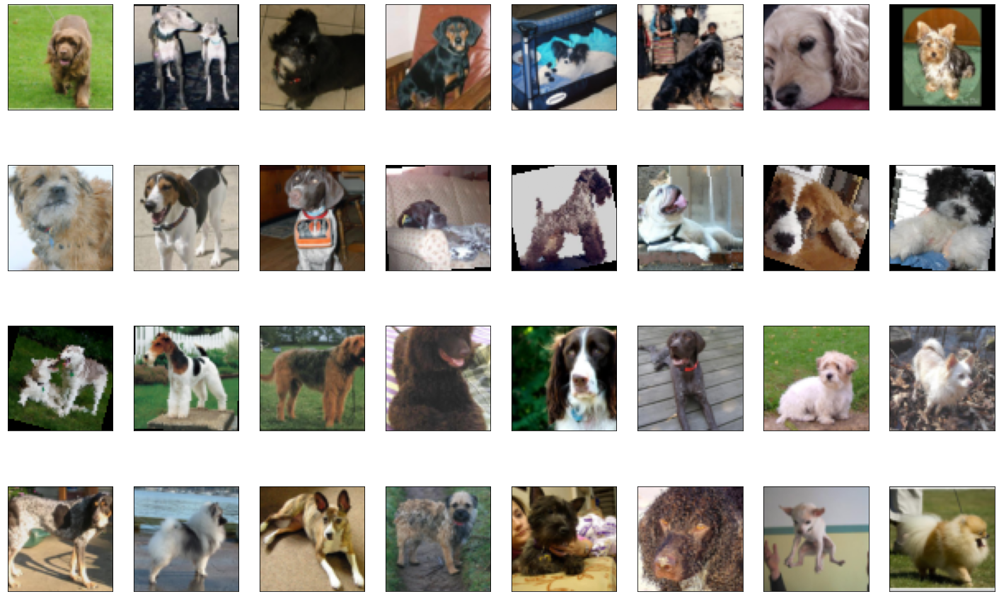

In [4]:
fig = plt.figure(figsize=(25, 16))
for ii, img in enumerate(imgs):
    ax = fig.add_subplot(4, 8, ii + 1, xticks=[], yticks=[])
    
    plt.imshow((img+1.)/2.)

In [5]:
def weights_init(m):
    """
    Takes as input a neural network m that will initialize all its weights.
    """
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        m.weight.data.normal_(1.0, 0.02)
        m.bias.data.fill_(0)

In [6]:
class G(nn.Module):
    def __init__(self):
        # Used to inherit the torch.nn Module
        super(G, self).__init__()
        # Meta Module - consists of different layers of Modules
        self.main = nn.Sequential(
                nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(64),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1, bias=False),
                nn.Tanh()
                )
        
    def forward(self, input):
        output = self.main(input)
        return output
# Creating the generator
#Generator = G()
#Generator.apply(weights_init)

In [7]:
# Defining the discriminator
class D(nn.Module):
    def __init__(self):
        super(D, self).__init__()
        self.main = nn.Sequential(
                nn.Conv2d(3, 64, 4, stride=2, padding=1, bias=False),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(64, 128, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(128),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(128, 256, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(256, 512, 4, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2, inplace=True),
                nn.Conv2d(512, 1, 4, stride=1, padding=0, bias=False),
                nn.Sigmoid()
                )
        
    def forward(self, input):
        output = self.main(input)
        # .view(-1) = Flattens the output into 1D instead of 2D
        return output.view(-1,1)
    
# Creating the discriminator
#Discriminator = D()
#Discriminator.apply(weights_init)

In [8]:
batch_size = 32
LR_G = 0.001
LR_D = 0.001

beta1 = 0.5
epochs = 300

real_label = 0.5
fake_label = 0
nz = 100

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [9]:
netG = G().to(device)
netG.apply(weights_init)
netD = D().to(device)
netD.apply(weights_init)

criterion = nn.BCELoss()

optimizerD = optim.Adam(netD.parameters(), lr=LR_D, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=LR_G, betas=(beta1, 0.999))



In [10]:
def plot_loss (G_losses, D_losses, epoch):
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss - EPOCH "+ str(epoch))
    plt.plot(G_losses,label="G")
    plt.plot(D_losses,label="D")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

In [11]:
def show_generated_img(n_images=5):
    sample = []
    for _ in range(n_images):
        noise = torch.randn(1, nz, 1, 1, device=device)
        gen_image = netG(noise).to("cpu").clone().detach().squeeze(0)
        gen_image = gen_image.numpy().transpose(1, 2, 0)
        sample.append(gen_image)
    
    figure, axes = plt.subplots(1, len(sample), figsize = (64,64))
    for index, axis in enumerate(axes):
        axis.axis('off')
        image_array = sample[index]
        axis.imshow((image_array+1.)/2.)
        
    plt.show()
    plt.close()

In [12]:
MODEL_NAME = "dcgan-v6.pt"
MODEL_PATH=os.path.join(CHK_PTS_DIR,MODEL_NAME)


In [13]:
def train(use_chkpt):
    
    fixed_noise = torch.randn(25, nz, 1, 1, device=device)
    G_losses = []
    D_losses = []
    epoch_time = []
    
    if use_chkpt:
        #print("here")
        checkpoint = torch.load(MODEL_PATH)
        netG.load_state_dict(checkpoint['gen_state_dict'])
        netD.load_state_dict(checkpoint['dis_state_dict'])
        optimizerG.load_state_dict(checkpoint['gen_optimizer_state_dict'])
        optimizerD.load_state_dict(checkpoint['dis_optimizer_state_dict'])
        curr_epoch = checkpoint['epoch']
        errG = checkpoint['gen_loss']
        errD = checkpoint['dis_loss']
        #print(curr_epoch)
    else:
        curr_epoch=0
    #print(curr_epoch)
    for epoch in range(curr_epoch+1,epochs):
        #print(epoch)
        start = time.time()
        for ii, (real_images, train_labels) in tqdm(enumerate(train_loader), total=len(train_loader)):
            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            # train with real
            netD.zero_grad()
            real_images = real_images.to(device)
            batch_size = real_images.size(0)
            #labels = torch.full((batch_size, 1), real_label, device=device)
            labels = (0.9-0.7)*torch.rand((batch_size, 1),device=device) + 0.7

            output = netD(real_images)
            errD_real = criterion(output, labels)
            errD_real.backward()
            D_x = output.mean().item()

            # train with fake
            noise = torch.randn(batch_size, nz, 1, 1, device=device)
            fake = netG(noise)
            #labels.fill_(fake_label)
            labels = (0.3-0.0)*torch.rand((batch_size, 1),device=device) + 0.0
            output = netD(fake.detach())
            errD_fake = criterion(output, labels)
            errD_fake.backward()
            D_G_z1 = output.mean().item()
            errD = errD_real + errD_fake
            optimizerD.step()

            ############################
            # (2) Update G network: maximize log(D(G(z)))
            ###########################
            netG.zero_grad()
            #labels.fill_(real_label)  # fake labels are real for generator cost
            labels = (0.9-0.6)*torch.rand((batch_size, 1),device=device) + 0.6
            output = netD(fake)
            errG = criterion(output, labels)
            errG.backward()
            D_G_z2 = output.mean().item()
            optimizerG.step()

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())

            if (ii+1) % (len(train_loader)//2) == 0:
                print('[%d/%d][%d/%d] Loss_D: %.4f Loss_G: %.4f D(x): %.4f D(G(z)): %.4f / %.4f'
                      % (epoch + 1, epochs, ii+1, len(train_loader),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))


        if epoch % 1 == 0:
            show_generated_img()
            torch.save({
                'epoch': epoch,
                'gen_state_dict': netG.state_dict(),
                'gen_optimizer_state_dict': optimizerG.state_dict(),
                'dis_state_dict': netD.state_dict(),
                'dis_optimizer_state_dict': optimizerD.state_dict(),
                'gen_loss': errG,
                'dis_loss': errD,
                }, MODEL_PATH)

        plot_loss (G_losses, D_losses, epoch)
        G_losses = []
        D_losses = []

        epoch_time.append(time.time()- start)

 50%|████████████████████████████████████████                                        | 322/644 [01:54<01:46,  3.01it/s]

[87/300][322/644] Loss_D: 0.9234 Loss_G: 1.2659 D(x): 0.7554 D(G(z)): 0.1785 / 0.2059


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [04:48<00:00,  2.23it/s]

[87/300][644/644] Loss_D: 1.0204 Loss_G: 0.9936 D(x): 0.7932 D(G(z)): 0.0762 / 0.4829


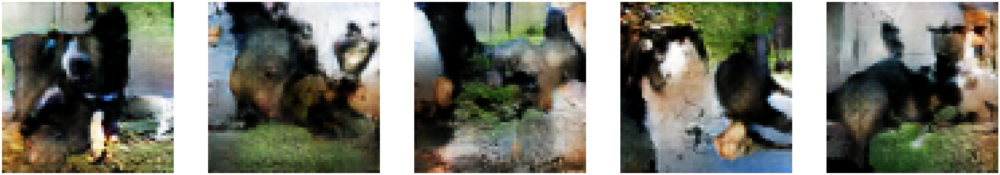

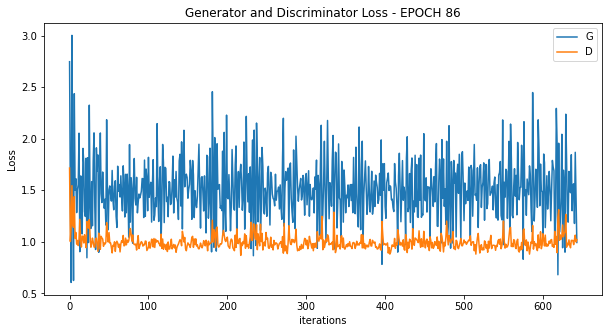

 50%|████████████████████████████████████████                                        | 322/644 [05:00<05:01,  1.07it/s]

[88/300][322/644] Loss_D: 0.8936 Loss_G: 1.9323 D(x): 0.8794 D(G(z)): 0.1490 / 0.0913


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:15<00:00,  1.05it/s]

[88/300][644/644] Loss_D: 1.9365 Loss_G: 0.7203 D(x): 0.1702 D(G(z)): 0.1807 / 0.7426


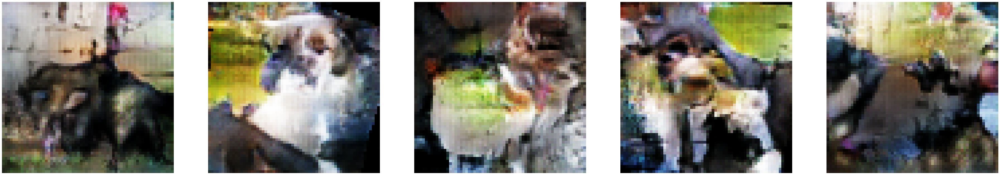

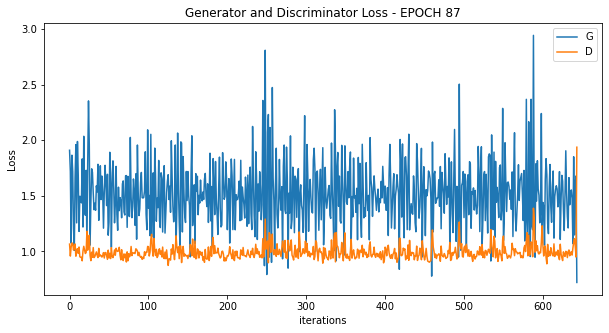

 50%|████████████████████████████████████████                                        | 322/644 [05:23<05:44,  1.07s/it]

[89/300][322/644] Loss_D: 0.9357 Loss_G: 1.3230 D(x): 0.7876 D(G(z)): 0.2156 / 0.1870


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[89/300][644/644] Loss_D: 1.2546 Loss_G: 0.7892 D(x): 0.4782 D(G(z)): 0.1539 / 0.8661


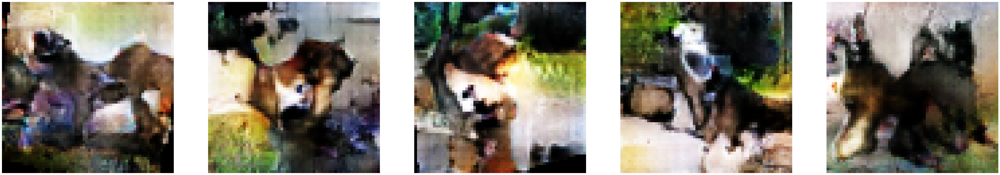

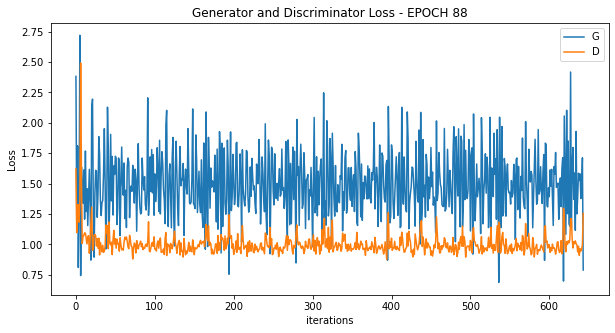

 50%|████████████████████████████████████████                                        | 322/644 [05:29<06:03,  1.13s/it]

[90/300][322/644] Loss_D: 0.9207 Loss_G: 1.4307 D(x): 0.7552 D(G(z)): 0.1421 / 0.1613


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[90/300][644/644] Loss_D: 1.4246 Loss_G: 0.6455 D(x): 0.3375 D(G(z)): 0.0715 / 0.9275


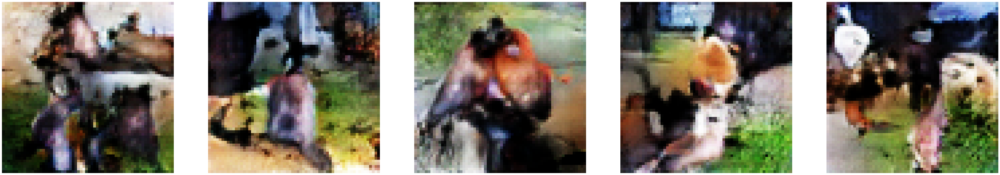

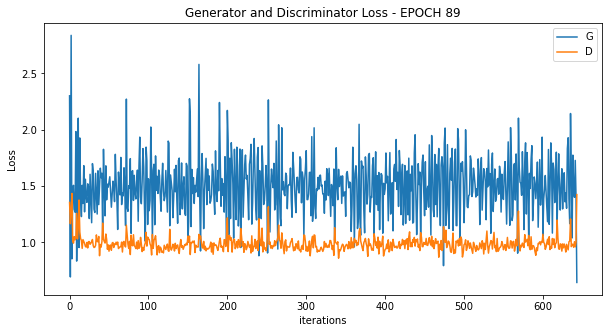

 50%|████████████████████████████████████████                                        | 322/644 [05:29<05:50,  1.09s/it]

[91/300][322/644] Loss_D: 0.9079 Loss_G: 1.7060 D(x): 0.8163 D(G(z)): 0.1217 / 0.1123


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:03<00:00,  1.03s/it]

[91/300][644/644] Loss_D: 1.2073 Loss_G: 1.0713 D(x): 0.9261 D(G(z)): 0.0532 / 0.3844


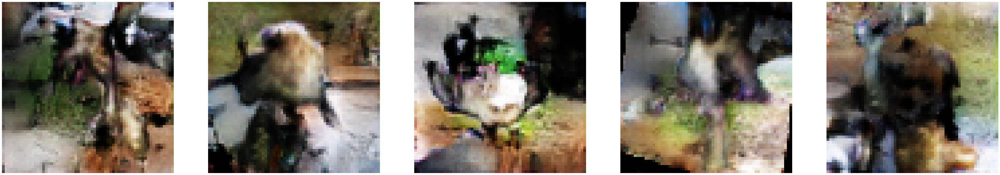

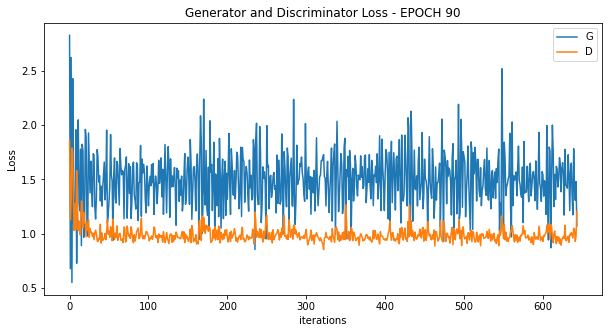

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:45,  1.07s/it]

[92/300][322/644] Loss_D: 1.0711 Loss_G: 2.5224 D(x): 0.8474 D(G(z)): 0.3645 / 0.0344


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:13<00:00,  1.05s/it]

[92/300][644/644] Loss_D: 1.4495 Loss_G: 0.6322 D(x): 0.2860 D(G(z)): 0.0731 / 0.6521


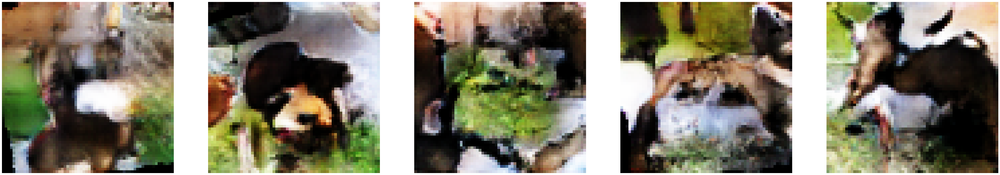

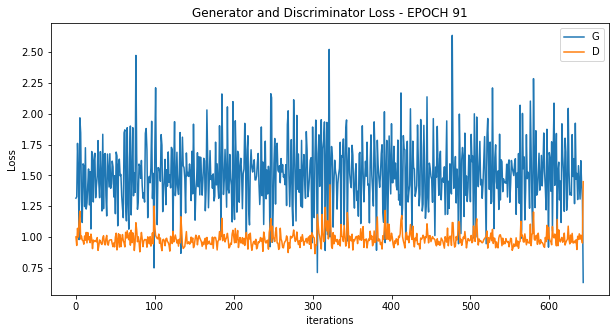

 50%|████████████████████████████████████████                                        | 322/644 [05:34<05:58,  1.11s/it]

[93/300][322/644] Loss_D: 0.9652 Loss_G: 1.6375 D(x): 0.7660 D(G(z)): 0.2190 / 0.1337


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:12<00:00,  1.04s/it]

[93/300][644/644] Loss_D: 1.5113 Loss_G: 0.7193 D(x): 0.2990 D(G(z)): 0.1303 / 0.6030


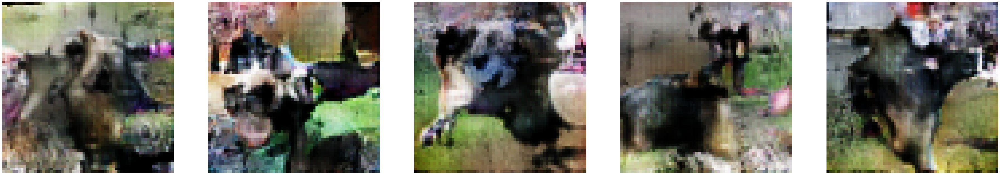

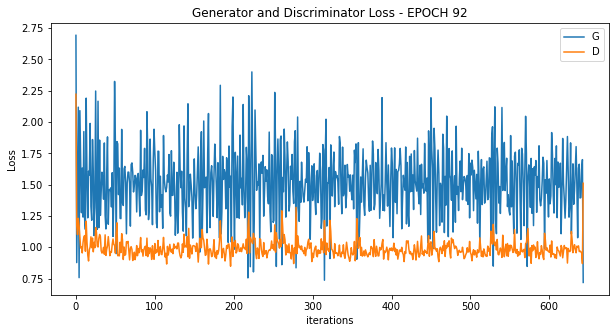

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:06,  1.05it/s]

[94/300][322/644] Loss_D: 0.9556 Loss_G: 1.4026 D(x): 0.7017 D(G(z)): 0.0995 / 0.1725


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:08<00:00,  1.04s/it]

[94/300][644/644] Loss_D: 1.6676 Loss_G: 0.5902 D(x): 0.1856 D(G(z)): 0.0795 / 0.7240


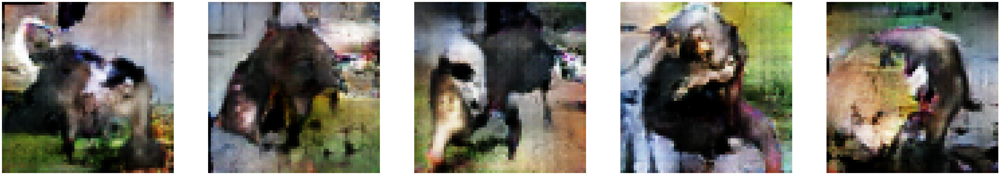

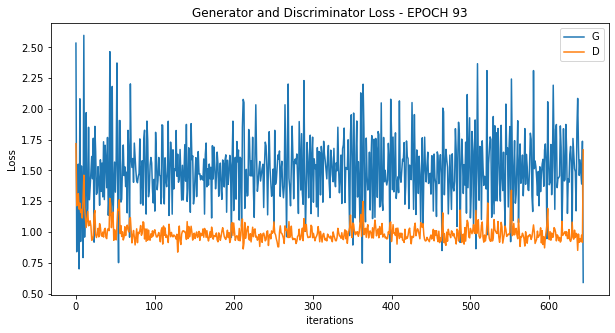

 50%|████████████████████████████████████████                                        | 322/644 [05:34<04:57,  1.08it/s]

[95/300][322/644] Loss_D: 1.0029 Loss_G: 1.6198 D(x): 0.8549 D(G(z)): 0.2952 / 0.1335


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:03<00:00,  1.03s/it]

[95/300][644/644] Loss_D: 0.7281 Loss_G: 4.0162 D(x): 0.8090 D(G(z)): 0.1578 / 0.0037


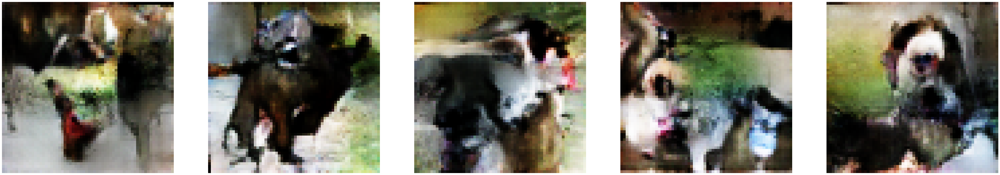

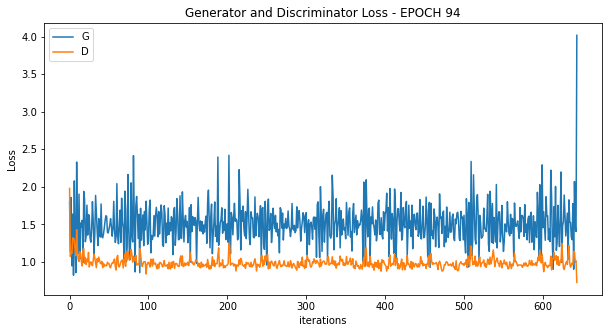

 50%|████████████████████████████████████████                                        | 322/644 [05:42<05:41,  1.06s/it]

[96/300][322/644] Loss_D: 0.9783 Loss_G: 1.3441 D(x): 0.7174 D(G(z)): 0.1714 / 0.1855


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[96/300][644/644] Loss_D: 1.8627 Loss_G: 0.8069 D(x): 0.2035 D(G(z)): 0.1488 / 0.6186


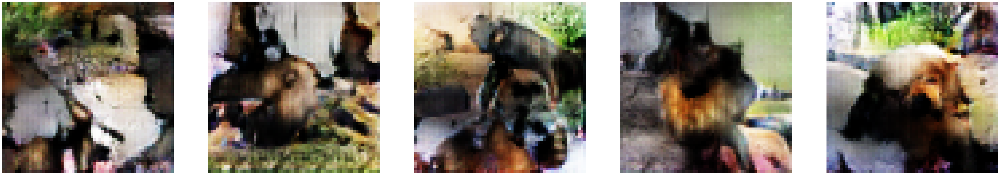

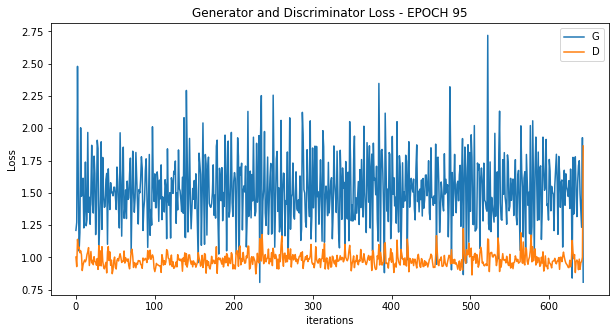

 50%|████████████████████████████████████████                                        | 322/644 [05:44<05:00,  1.07it/s]

[97/300][322/644] Loss_D: 1.0006 Loss_G: 1.4644 D(x): 0.7043 D(G(z)): 0.2521 / 0.1582


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:17<00:00,  1.05s/it]

[97/300][644/644] Loss_D: 1.1082 Loss_G: 0.7453 D(x): 0.5024 D(G(z)): 0.0851 / 0.5450


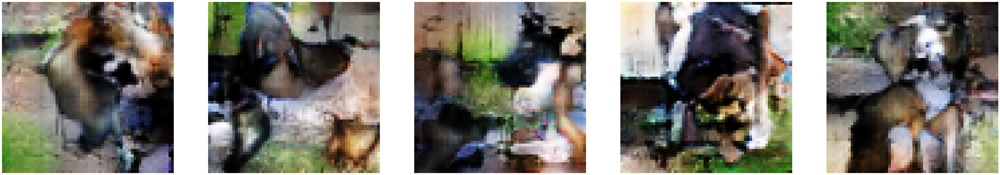

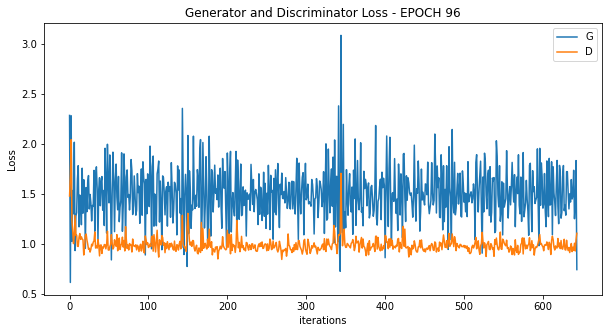

 50%|████████████████████████████████████████                                        | 322/644 [05:35<04:56,  1.09it/s]

[98/300][322/644] Loss_D: 0.9872 Loss_G: 1.7692 D(x): 0.8783 D(G(z)): 0.2590 / 0.0886


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[98/300][644/644] Loss_D: 1.4410 Loss_G: 1.0827 D(x): 0.3925 D(G(z)): 0.0601 / 0.9497


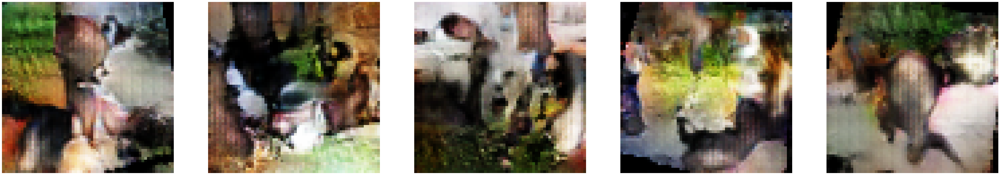

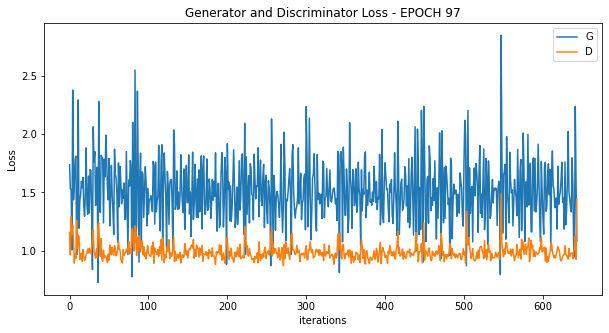

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:01,  1.07it/s]

[99/300][322/644] Loss_D: 1.1140 Loss_G: 1.0816 D(x): 0.5370 D(G(z)): 0.1249 / 0.2704


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:15<00:00,  1.05s/it]

[99/300][644/644] Loss_D: 1.2047 Loss_G: 0.6627 D(x): 0.4669 D(G(z)): 0.0803 / 0.5393


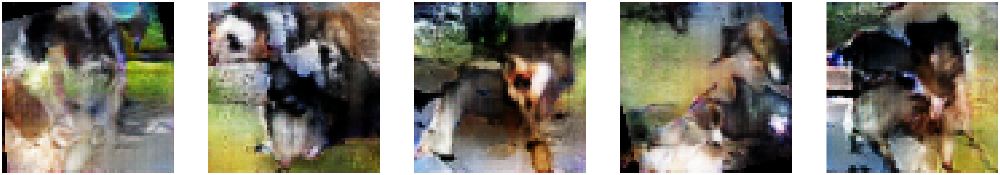

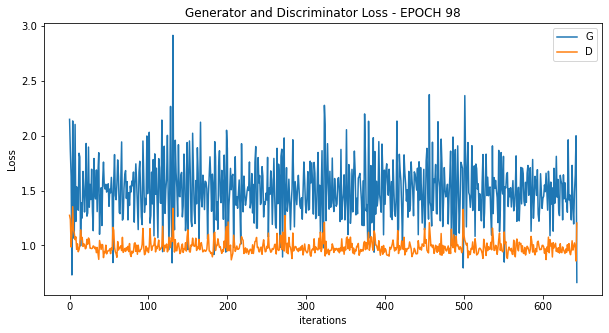

 50%|████████████████████████████████████████                                        | 322/644 [05:41<05:25,  1.01s/it]

[100/300][322/644] Loss_D: 1.0155 Loss_G: 1.2636 D(x): 0.6669 D(G(z)): 0.2327 / 0.2154


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[100/300][644/644] Loss_D: 1.0627 Loss_G: 0.8294 D(x): 0.8891 D(G(z)): 0.1245 / 0.5968


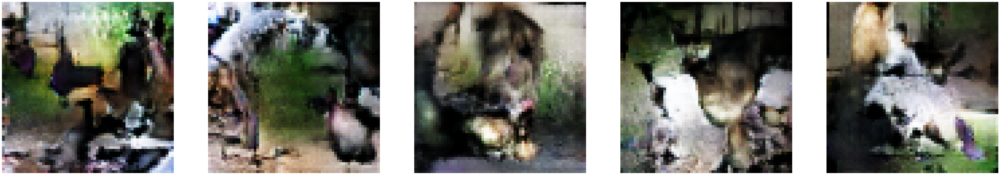

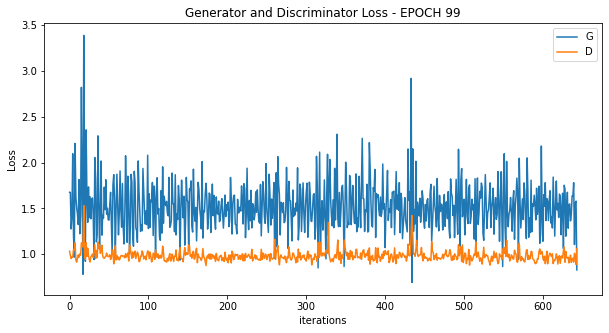

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:10,  1.04it/s]

[101/300][322/644] Loss_D: 1.0973 Loss_G: 1.0311 D(x): 0.5438 D(G(z)): 0.1396 / 0.2938


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[101/300][644/644] Loss_D: 0.8062 Loss_G: 1.9197 D(x): 0.5098 D(G(z)): 0.0589 / 0.0839


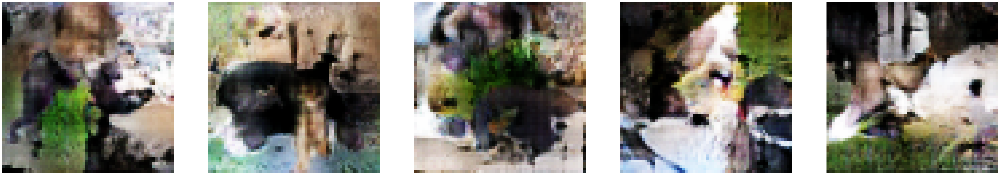

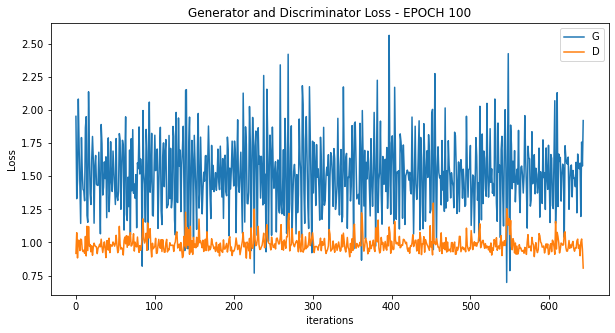

 50%|████████████████████████████████████████                                        | 322/644 [05:40<05:10,  1.04it/s]

[102/300][322/644] Loss_D: 0.9880 Loss_G: 1.5509 D(x): 0.8086 D(G(z)): 0.1274 / 0.1422


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:12<00:00,  1.04s/it]

[102/300][644/644] Loss_D: 1.0080 Loss_G: 0.6257 D(x): 0.7827 D(G(z)): 0.0520 / 0.7120


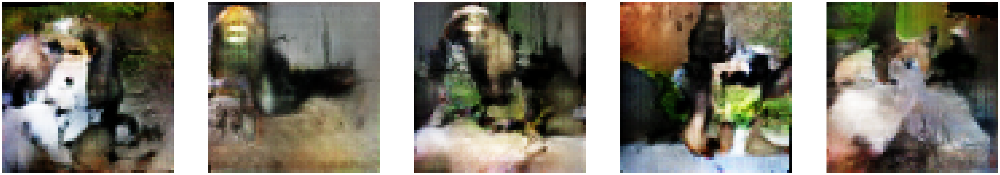

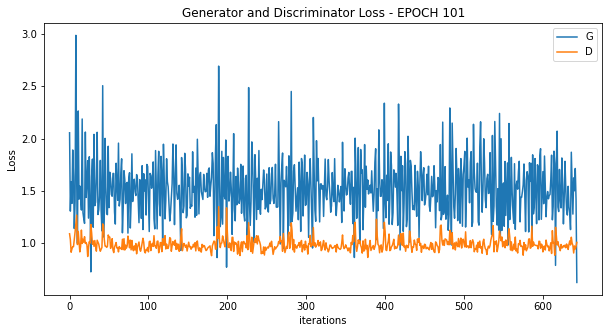

 50%|████████████████████████████████████████                                        | 322/644 [05:43<06:07,  1.14s/it]

[103/300][322/644] Loss_D: 1.0760 Loss_G: 0.9572 D(x): 0.6039 D(G(z)): 0.1309 / 0.3251


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[103/300][644/644] Loss_D: 0.8490 Loss_G: 1.4683 D(x): 0.7506 D(G(z)): 0.1227 / 0.1811


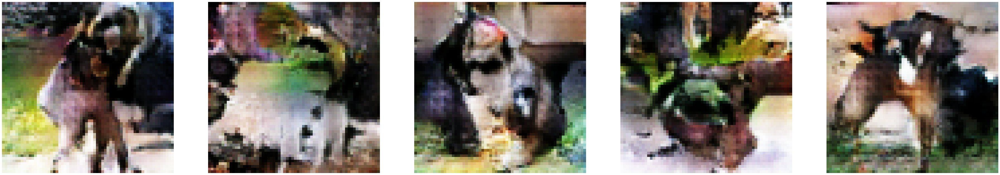

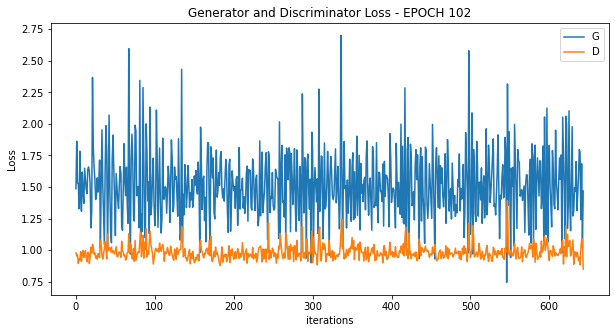

 50%|████████████████████████████████████████                                        | 322/644 [05:44<05:12,  1.03it/s]

[104/300][322/644] Loss_D: 0.9601 Loss_G: 1.5161 D(x): 0.8123 D(G(z)): 0.1686 / 0.1395


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[104/300][644/644] Loss_D: 1.0068 Loss_G: 1.5926 D(x): 0.7565 D(G(z)): 0.1758 / 0.2364


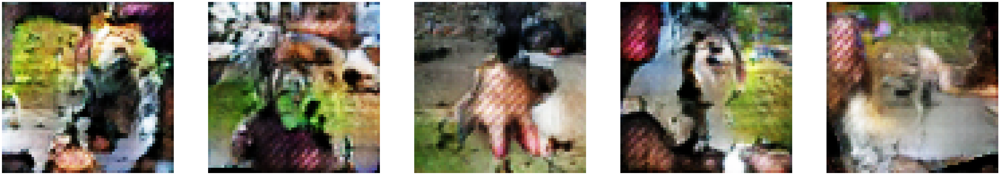

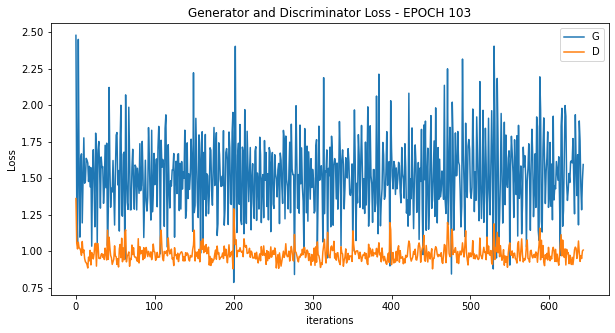

 50%|████████████████████████████████████████                                        | 322/644 [05:46<04:57,  1.08it/s]

[105/300][322/644] Loss_D: 0.9286 Loss_G: 1.2273 D(x): 0.7609 D(G(z)): 0.1498 / 0.2280


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:12<00:00,  1.04s/it]

[105/300][644/644] Loss_D: 0.8622 Loss_G: 2.0042 D(x): 0.6482 D(G(z)): 0.1024 / 0.0955


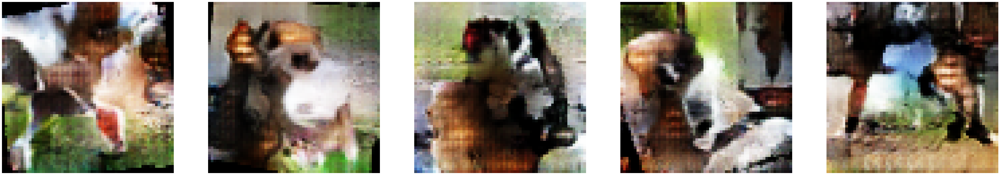

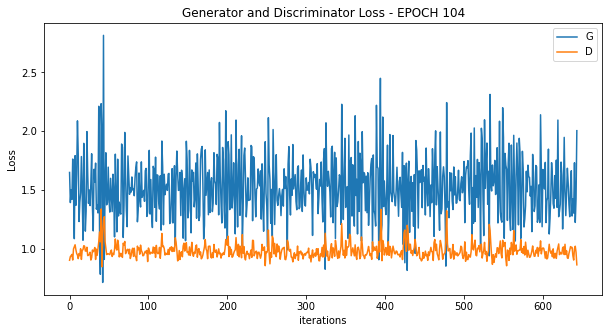

 50%|████████████████████████████████████████                                        | 322/644 [05:40<05:58,  1.11s/it]

[106/300][322/644] Loss_D: 0.9821 Loss_G: 1.4159 D(x): 0.7484 D(G(z)): 0.1951 / 0.1692


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:13<00:00,  1.05s/it]

[106/300][644/644] Loss_D: 1.5542 Loss_G: 0.8804 D(x): 0.2845 D(G(z)): 0.0496 / 0.9165


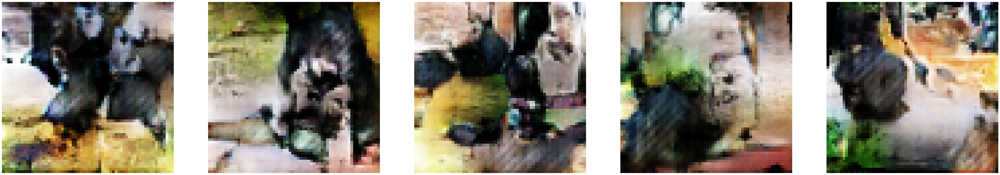

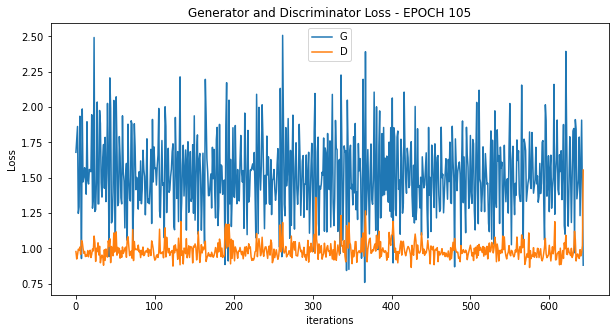

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:08,  1.04it/s]

[107/300][322/644] Loss_D: 0.9675 Loss_G: 1.4619 D(x): 0.7237 D(G(z)): 0.1990 / 0.1591


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[107/300][644/644] Loss_D: 1.4907 Loss_G: 0.6544 D(x): 0.3137 D(G(z)): 0.1640 / 0.6360


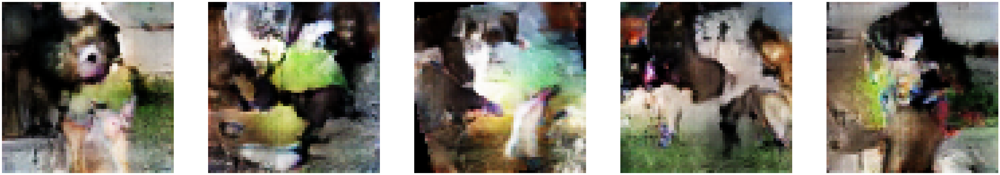

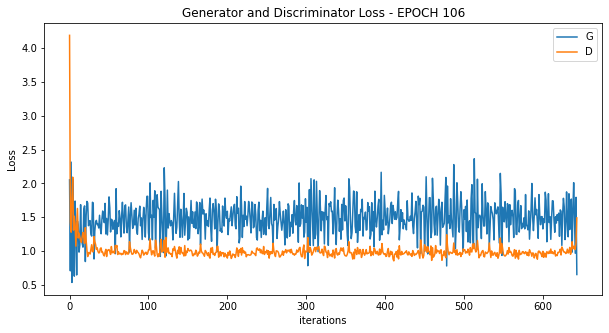

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:01,  1.07it/s]

[108/300][322/644] Loss_D: 1.0206 Loss_G: 1.5683 D(x): 0.8109 D(G(z)): 0.3216 / 0.1363


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[108/300][644/644] Loss_D: 0.9540 Loss_G: 1.5568 D(x): 0.7035 D(G(z)): 0.1059 / 0.3142


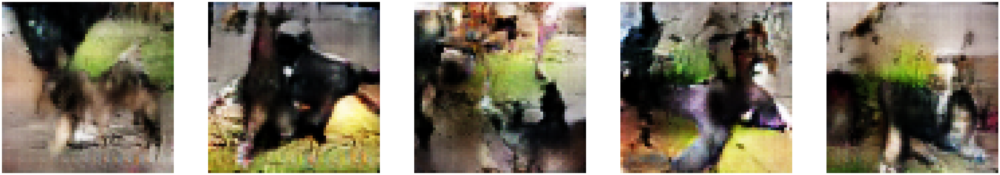

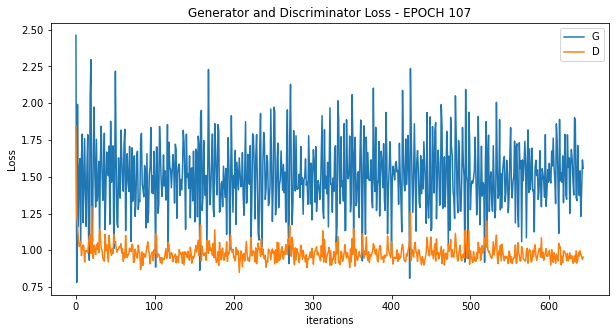

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:06,  1.05it/s]

[109/300][322/644] Loss_D: 0.9710 Loss_G: 1.5182 D(x): 0.8700 D(G(z)): 0.1360 / 0.1518


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:12<00:00,  1.04s/it]

[109/300][644/644] Loss_D: 1.2219 Loss_G: 0.7681 D(x): 0.5755 D(G(z)): 0.1131 / 0.9663


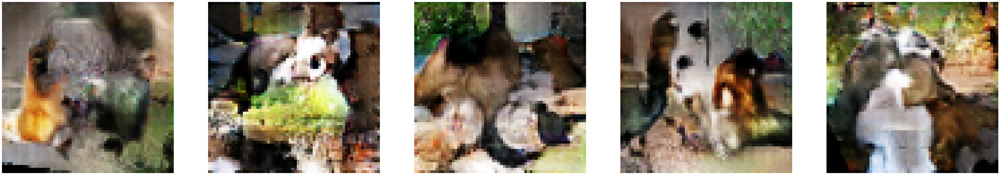

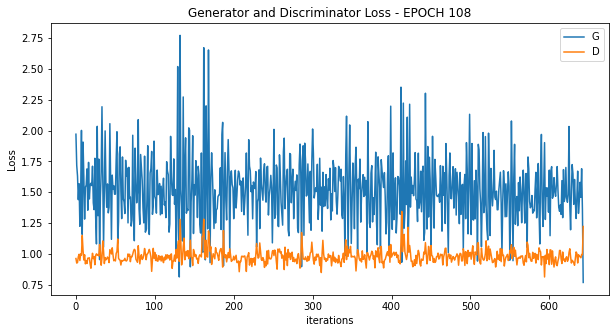

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:02,  1.07it/s]

[110/300][322/644] Loss_D: 0.9359 Loss_G: 1.5518 D(x): 0.8221 D(G(z)): 0.1760 / 0.1321


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:05<00:00,  1.03s/it]

[110/300][644/644] Loss_D: 0.8882 Loss_G: 1.1421 D(x): 0.6928 D(G(z)): 0.1027 / 0.2981


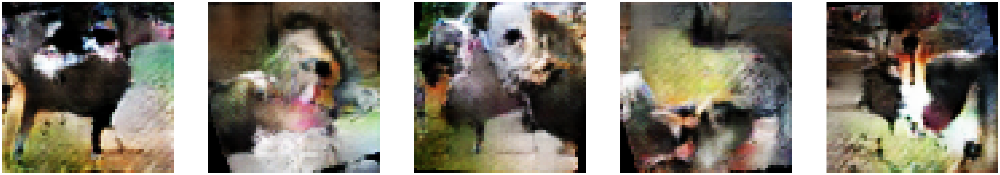

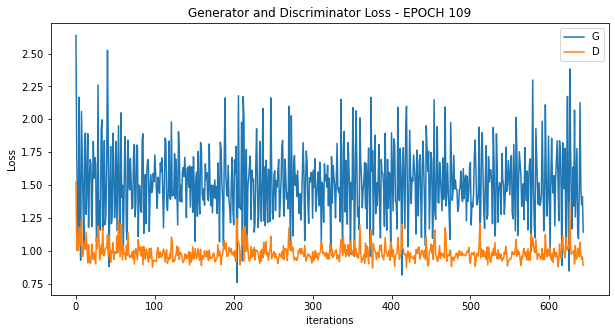

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:02,  1.07it/s]

[111/300][322/644] Loss_D: 1.0158 Loss_G: 1.3284 D(x): 0.6712 D(G(z)): 0.1104 / 0.1965


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[111/300][644/644] Loss_D: 1.2014 Loss_G: 0.7038 D(x): 0.5882 D(G(z)): 0.0422 / 0.8619


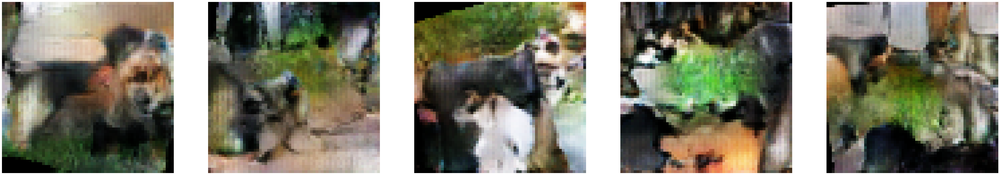

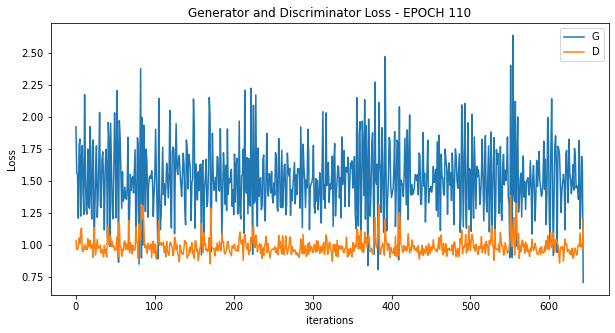

 50%|████████████████████████████████████████                                        | 322/644 [05:29<05:02,  1.07it/s]

[112/300][322/644] Loss_D: 1.0242 Loss_G: 1.1366 D(x): 0.6431 D(G(z)): 0.1085 / 0.2391


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:04<00:00,  1.03s/it]

[112/300][644/644] Loss_D: 1.3951 Loss_G: 0.6219 D(x): 0.3232 D(G(z)): 0.1139 / 0.9300


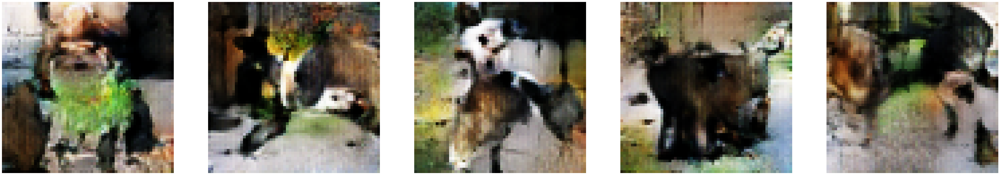

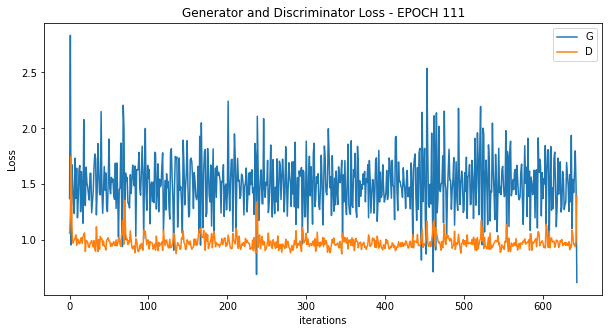

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:32,  1.03s/it]

[113/300][322/644] Loss_D: 0.9378 Loss_G: 1.6045 D(x): 0.7720 D(G(z)): 0.1328 / 0.1357


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:20<00:00,  1.06s/it]

[113/300][644/644] Loss_D: 1.3327 Loss_G: 0.8597 D(x): 0.2772 D(G(z)): 0.1178 / 0.3542


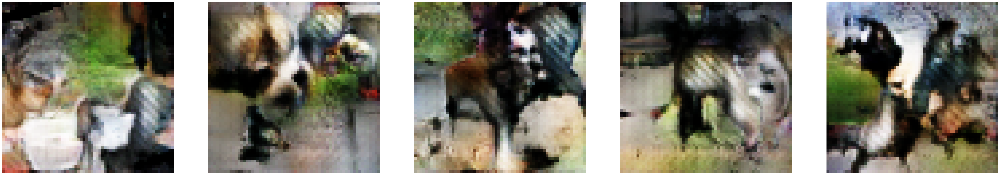

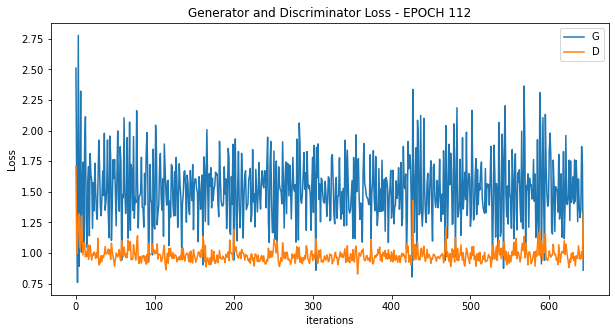

 50%|████████████████████████████████████████                                        | 322/644 [05:29<05:05,  1.05it/s]

[114/300][322/644] Loss_D: 0.9507 Loss_G: 1.3911 D(x): 0.7769 D(G(z)): 0.1161 / 0.1705


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[114/300][644/644] Loss_D: 0.9489 Loss_G: 0.5808 D(x): 0.7969 D(G(z)): 0.0676 / 0.6541


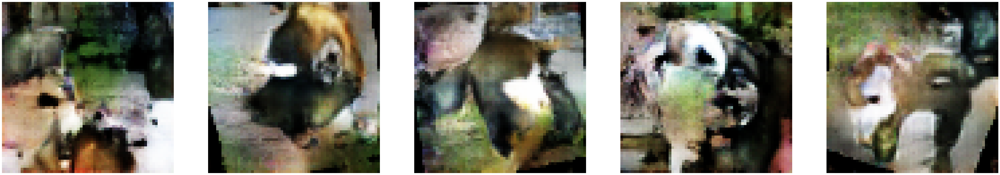

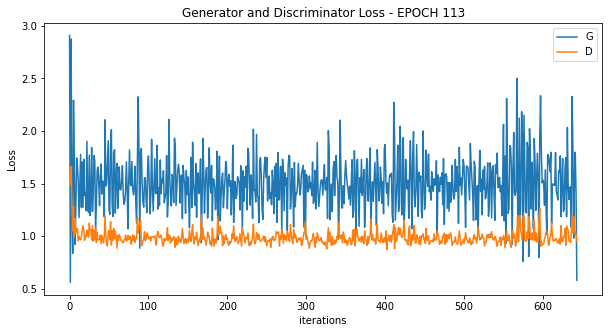

 50%|████████████████████████████████████████                                        | 322/644 [05:26<05:03,  1.06it/s]

[115/300][322/644] Loss_D: 0.9472 Loss_G: 1.5993 D(x): 0.7618 D(G(z)): 0.1742 / 0.1260


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:04<00:00,  1.03s/it]

[115/300][644/644] Loss_D: 1.5504 Loss_G: 0.6563 D(x): 0.3096 D(G(z)): 0.1435 / 0.8974


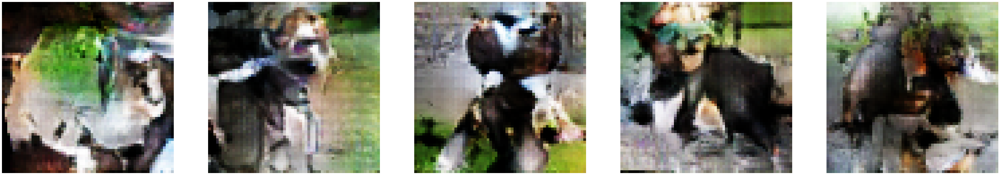

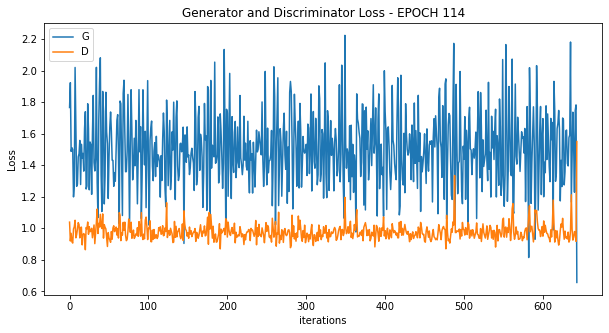

 50%|████████████████████████████████████████                                        | 322/644 [05:27<05:04,  1.06it/s]

[116/300][322/644] Loss_D: 0.9794 Loss_G: 1.3773 D(x): 0.7748 D(G(z)): 0.1616 / 0.1780


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:11<00:00,  1.04s/it]

[116/300][644/644] Loss_D: 1.4288 Loss_G: 0.7747 D(x): 0.3259 D(G(z)): 0.0683 / 0.8613


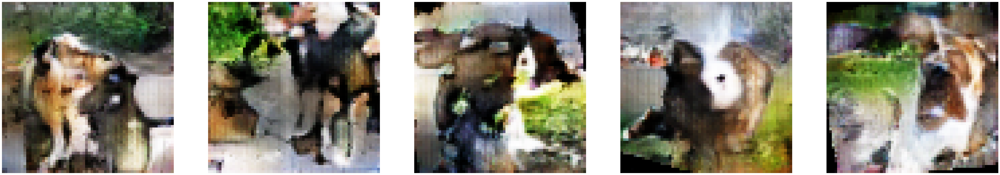

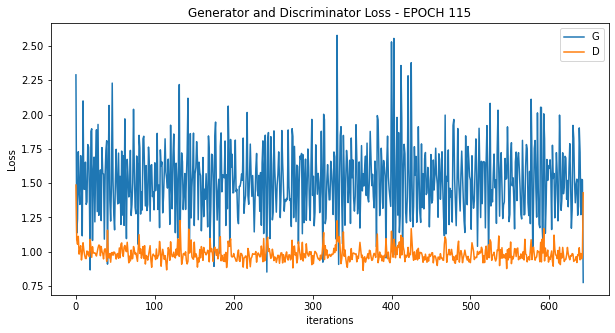

 50%|████████████████████████████████████████                                        | 322/644 [05:26<05:06,  1.05it/s]

[117/300][322/644] Loss_D: 0.8869 Loss_G: 1.3588 D(x): 0.7406 D(G(z)): 0.1518 / 0.1708


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[117/300][644/644] Loss_D: 1.5517 Loss_G: 2.1702 D(x): 0.2685 D(G(z)): 0.2435 / 0.1318


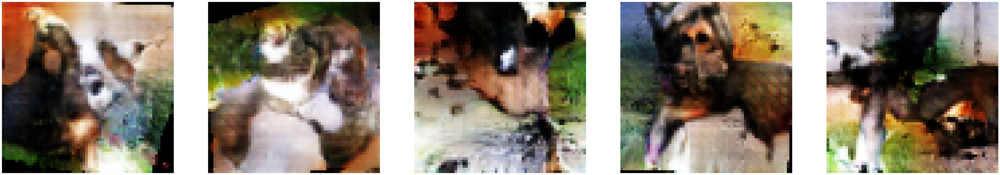

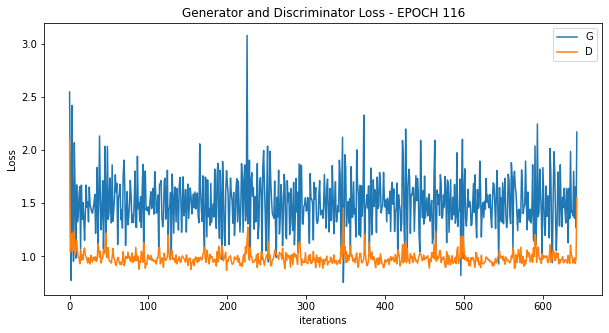

 50%|████████████████████████████████████████                                        | 322/644 [05:55<06:25,  1.20s/it]

[118/300][322/644] Loss_D: 0.9352 Loss_G: 1.7069 D(x): 0.7779 D(G(z)): 0.1433 / 0.1059


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:41<00:00,  1.09s/it]

[118/300][644/644] Loss_D: 1.1468 Loss_G: 1.0220 D(x): 0.5210 D(G(z)): 0.0283 / 0.5642


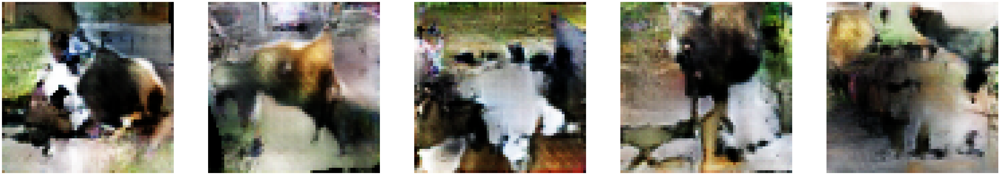

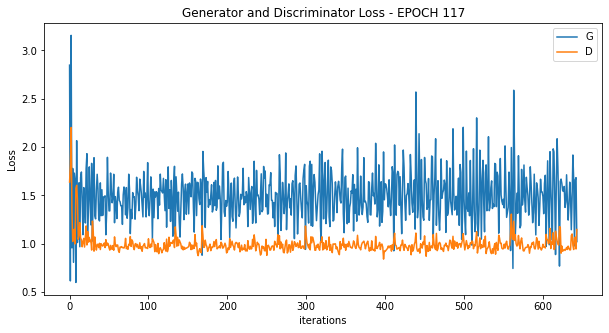

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:53,  1.10s/it]

[119/300][322/644] Loss_D: 0.9252 Loss_G: 1.5441 D(x): 0.7438 D(G(z)): 0.0805 / 0.1414


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:19<00:00,  1.05s/it]


[119/300][644/644] Loss_D: 1.0325 Loss_G: 0.9299 D(x): 0.5664 D(G(z)): 0.0749 / 0.4830


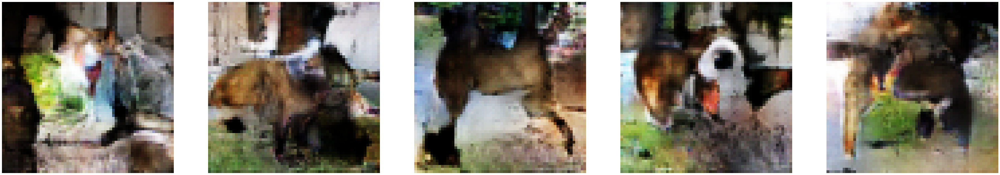

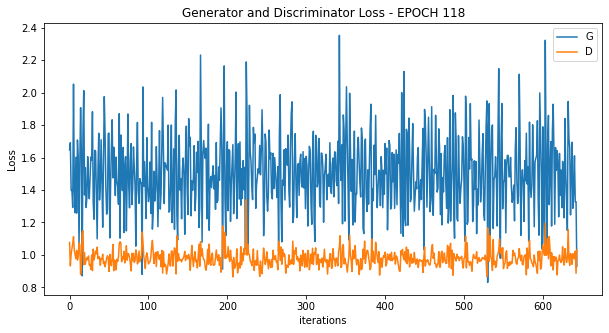

 50%|████████████████████████████████████████                                        | 322/644 [05:31<05:42,  1.06s/it]

[120/300][322/644] Loss_D: 0.9358 Loss_G: 1.8651 D(x): 0.8252 D(G(z)): 0.1256 / 0.1009


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[120/300][644/644] Loss_D: 1.1379 Loss_G: 0.8297 D(x): 0.8701 D(G(z)): 0.1304 / 0.8146


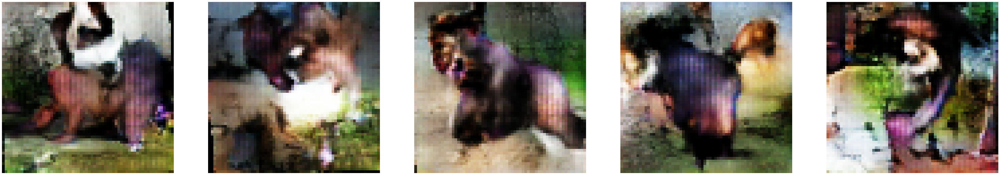

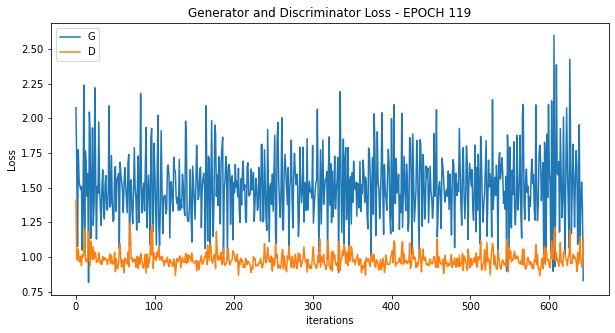

 50%|████████████████████████████████████████                                        | 322/644 [05:36<09:11,  1.71s/it]

[121/300][322/644] Loss_D: 0.9941 Loss_G: 1.4382 D(x): 0.7424 D(G(z)): 0.0819 / 0.1619


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[121/300][644/644] Loss_D: 0.9901 Loss_G: 1.0768 D(x): 0.8139 D(G(z)): 0.0983 / 0.4067


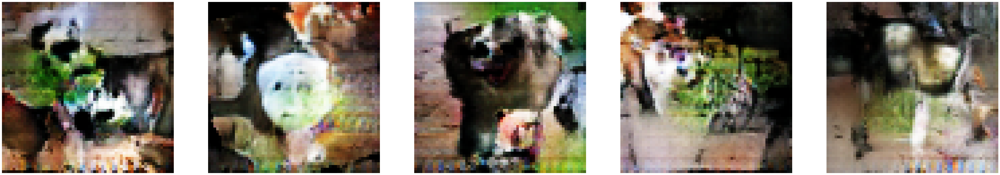

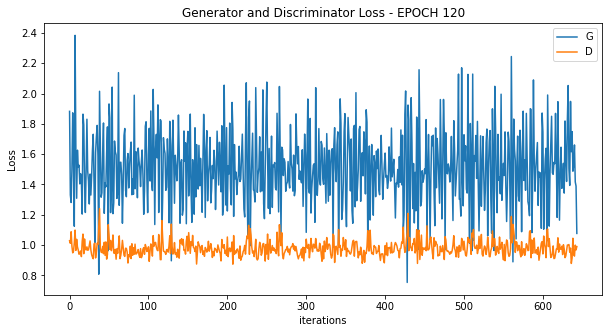

 50%|████████████████████████████████████████                                        | 322/644 [05:32<06:07,  1.14s/it]

[122/300][322/644] Loss_D: 1.0154 Loss_G: 1.7590 D(x): 0.8865 D(G(z)): 0.2745 / 0.0987


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[122/300][644/644] Loss_D: 1.1893 Loss_G: 0.7299 D(x): 0.6752 D(G(z)): 0.1088 / 0.7494


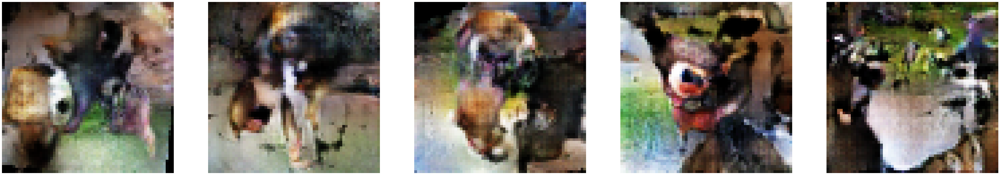

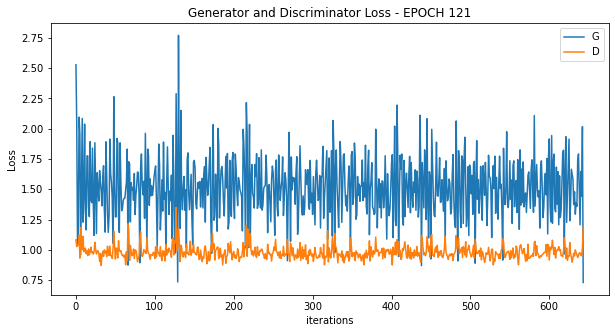

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:52,  1.10s/it]

[123/300][322/644] Loss_D: 0.9326 Loss_G: 1.6345 D(x): 0.8232 D(G(z)): 0.1398 / 0.1229


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[123/300][644/644] Loss_D: 1.7640 Loss_G: 1.1475 D(x): 0.2678 D(G(z)): 0.3199 / 0.5461


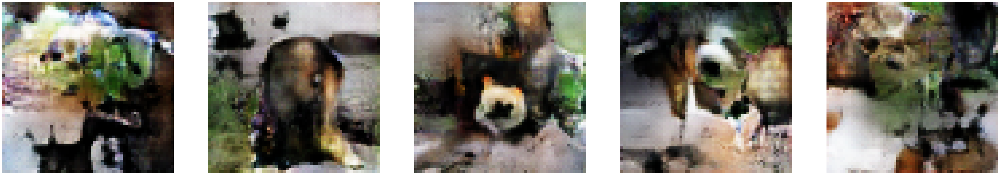

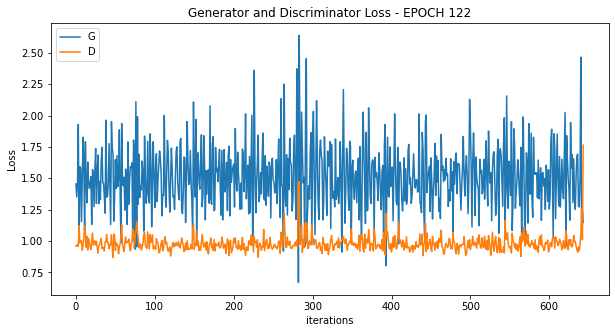

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:52,  1.09s/it]

[124/300][322/644] Loss_D: 0.8879 Loss_G: 1.6446 D(x): 0.8218 D(G(z)): 0.1288 / 0.1165


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:09<00:00,  1.04s/it]

[124/300][644/644] Loss_D: 1.0726 Loss_G: 0.6319 D(x): 0.6307 D(G(z)): 0.1228 / 0.7526


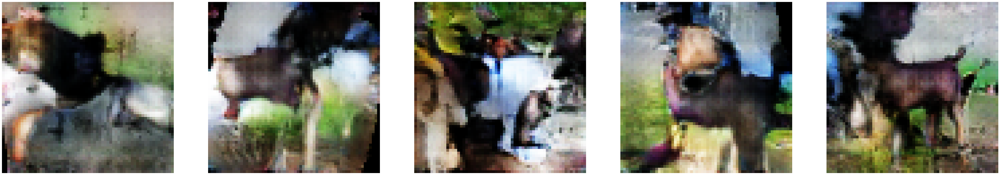

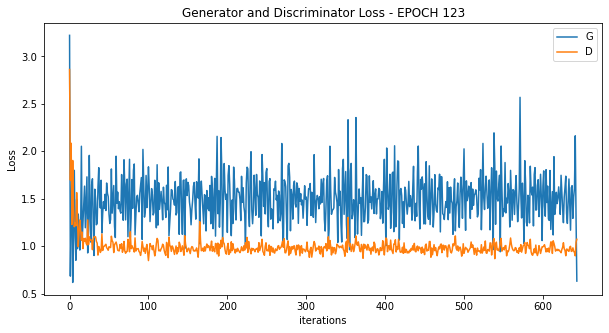

 50%|████████████████████████████████████████                                        | 322/644 [05:38<05:08,  1.04it/s]

[125/300][322/644] Loss_D: 0.8598 Loss_G: 1.7429 D(x): 0.8209 D(G(z)): 0.1267 / 0.1048


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[125/300][644/644] Loss_D: 1.6361 Loss_G: 0.6494 D(x): 0.2656 D(G(z)): 0.0394 / 0.7982


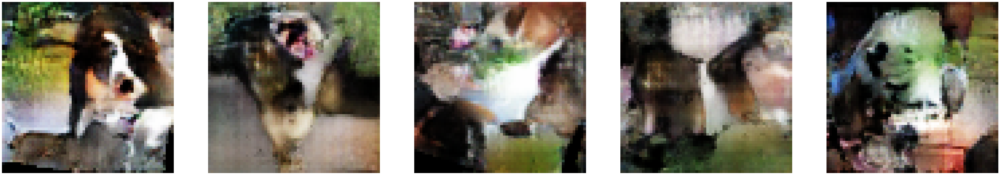

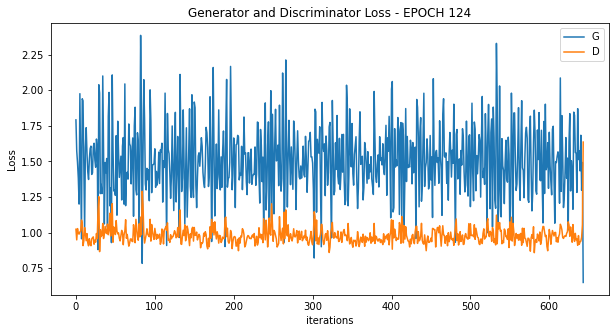

 50%|████████████████████████████████████████                                        | 322/644 [05:39<05:02,  1.06it/s]

[126/300][322/644] Loss_D: 0.9881 Loss_G: 1.3836 D(x): 0.8767 D(G(z)): 0.2577 / 0.1583


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[126/300][644/644] Loss_D: 2.0593 Loss_G: 0.7673 D(x): 0.1221 D(G(z)): 0.0969 / 0.8840


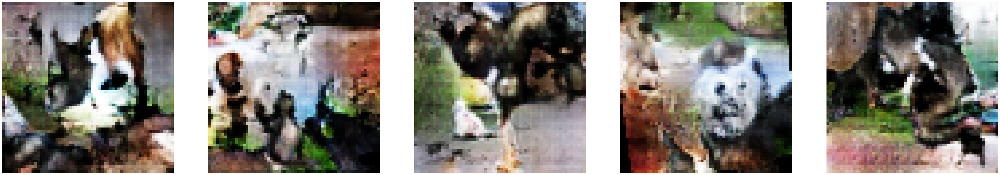

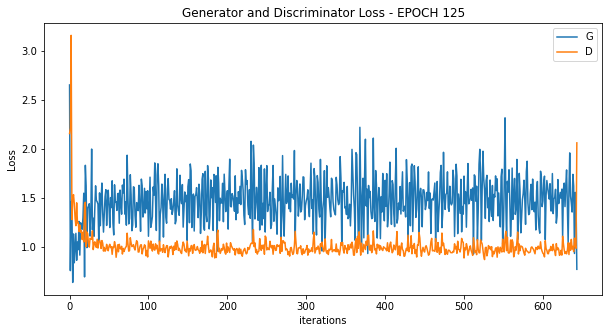

 50%|████████████████████████████████████████                                        | 322/644 [05:34<05:00,  1.07it/s]

[127/300][322/644] Loss_D: 0.9595 Loss_G: 1.3750 D(x): 0.6807 D(G(z)): 0.1495 / 0.1718


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:10<00:00,  1.04s/it]

[127/300][644/644] Loss_D: 1.3941 Loss_G: 0.5922 D(x): 0.2996 D(G(z)): 0.0206 / 0.6426


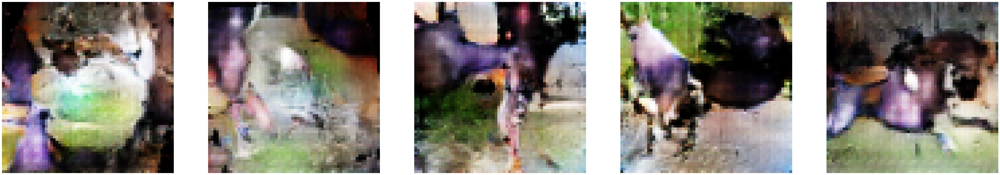

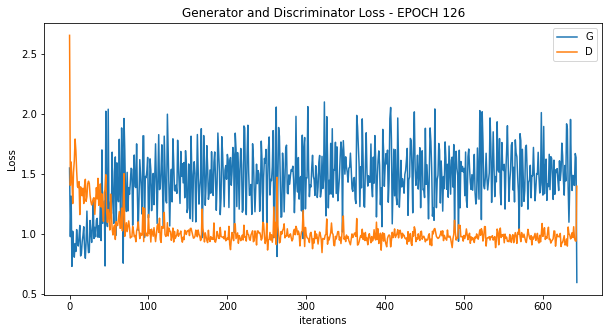

 50%|████████████████████████████████████████                                        | 322/644 [05:31<06:01,  1.12s/it]

[128/300][322/644] Loss_D: 1.0182 Loss_G: 1.7233 D(x): 0.8597 D(G(z)): 0.3236 / 0.0999


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:11<00:00,  1.04s/it]

[128/300][644/644] Loss_D: 0.9327 Loss_G: 1.1784 D(x): 0.8570 D(G(z)): 0.0945 / 0.3848


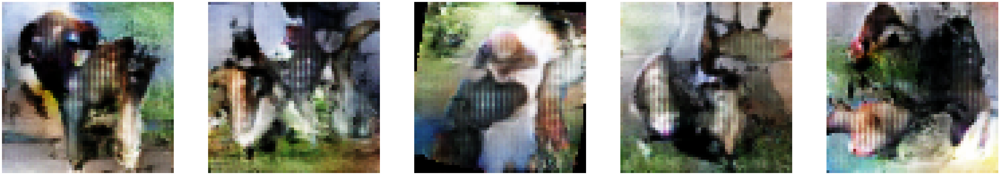

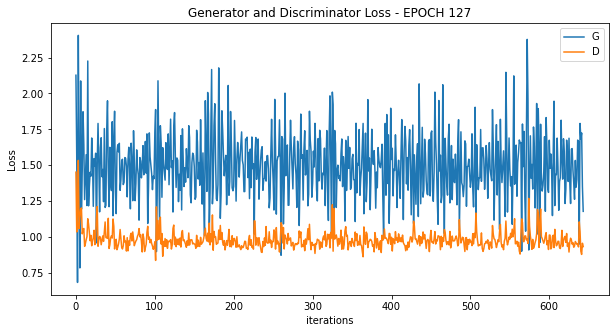

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:13,  1.03it/s]

[129/300][322/644] Loss_D: 0.9526 Loss_G: 1.3273 D(x): 0.7470 D(G(z)): 0.2308 / 0.1920


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:17<00:00,  1.05s/it]

[129/300][644/644] Loss_D: 0.8297 Loss_G: 2.4934 D(x): 0.8250 D(G(z)): 0.1361 / 0.0586


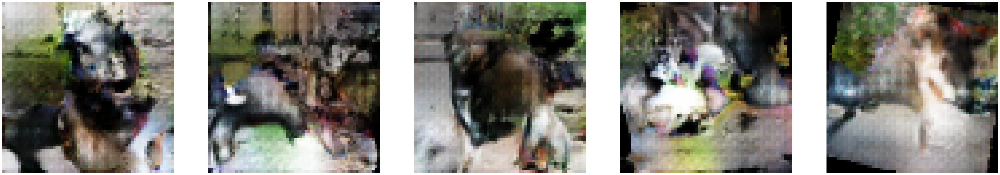

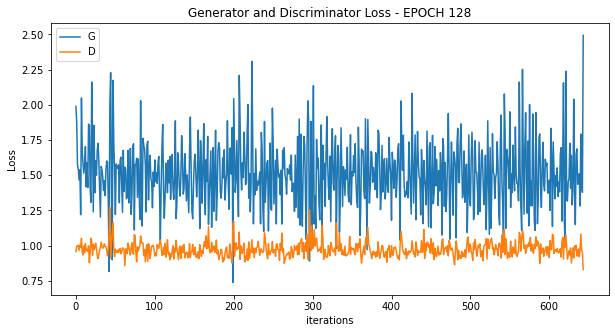

 50%|████████████████████████████████████████                                        | 322/644 [05:44<05:15,  1.02it/s]

[130/300][322/644] Loss_D: 0.9660 Loss_G: 1.1916 D(x): 0.7577 D(G(z)): 0.2439 / 0.2294


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:08<00:00,  1.04s/it]

[130/300][644/644] Loss_D: 1.2974 Loss_G: 1.0965 D(x): 0.6365 D(G(z)): 0.0835 / 0.9719


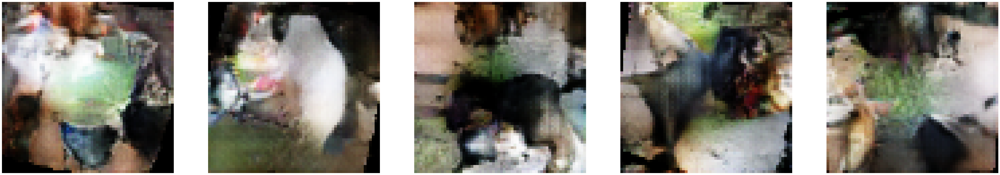

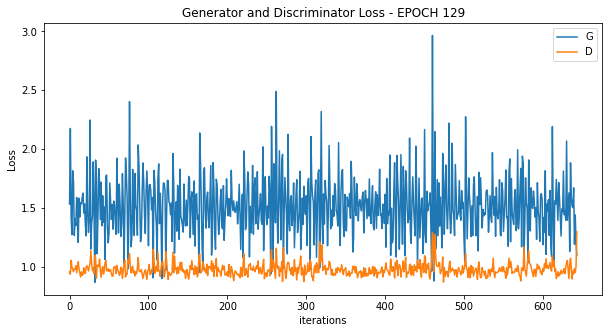

 50%|████████████████████████████████████████                                        | 322/644 [05:37<05:03,  1.06it/s]

[131/300][322/644] Loss_D: 0.9762 Loss_G: 1.6575 D(x): 0.7375 D(G(z)): 0.0875 / 0.1120


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:11<00:00,  1.04s/it]

[131/300][644/644] Loss_D: 0.7560 Loss_G: 2.2115 D(x): 0.8168 D(G(z)): 0.0951 / 0.0721


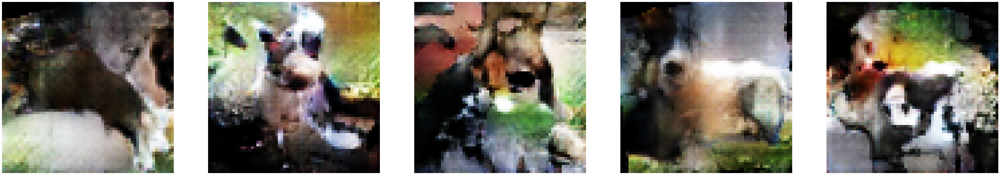

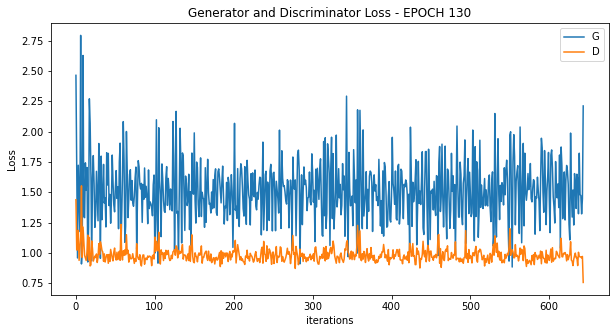

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:01,  1.07it/s]

[132/300][322/644] Loss_D: 0.9908 Loss_G: 1.1430 D(x): 0.8278 D(G(z)): 0.1582 / 0.2453


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:11<00:00,  1.04s/it]

[132/300][644/644] Loss_D: 0.7746 Loss_G: 2.0210 D(x): 0.7954 D(G(z)): 0.0990 / 0.1195


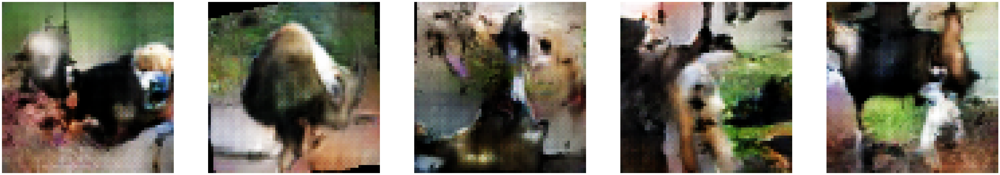

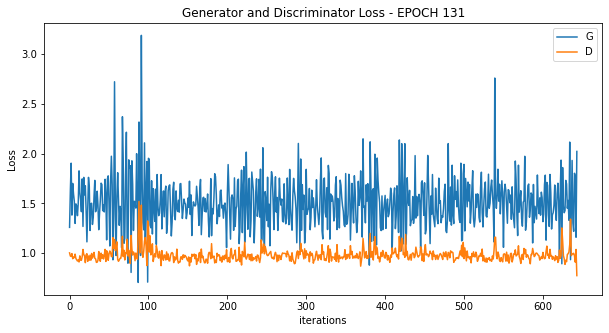

 50%|████████████████████████████████████████                                        | 322/644 [05:23<05:49,  1.08s/it]

[133/300][322/644] Loss_D: 0.9490 Loss_G: 1.2860 D(x): 0.8347 D(G(z)): 0.1255 / 0.2008


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:50<00:00,  1.01s/it]

[133/300][644/644] Loss_D: 1.1560 Loss_G: 0.7292 D(x): 0.5243 D(G(z)): 0.0584 / 0.8120


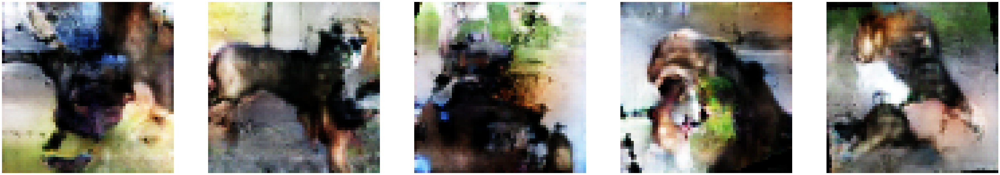

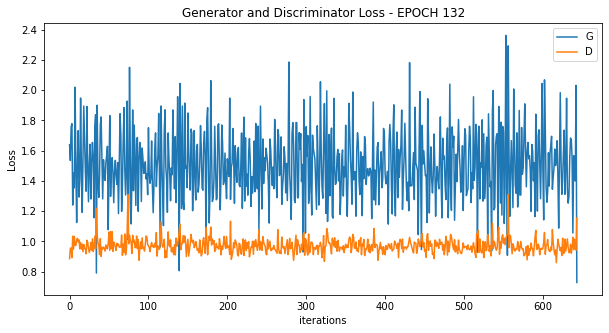

 50%|████████████████████████████████████████                                        | 322/644 [05:28<06:46,  1.26s/it]

[134/300][322/644] Loss_D: 0.8902 Loss_G: 1.7982 D(x): 0.7954 D(G(z)): 0.2229 / 0.1079


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:44<00:00,  1.00s/it]

[134/300][644/644] Loss_D: 0.8114 Loss_G: 1.5962 D(x): 0.8048 D(G(z)): 0.1129 / 0.1685


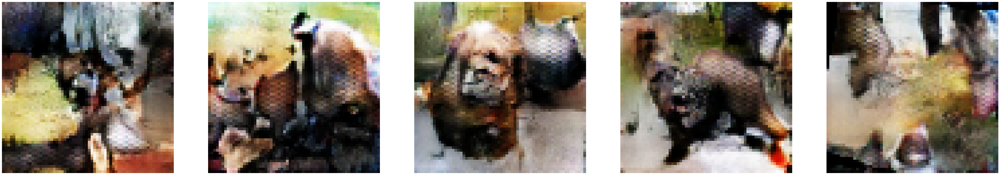

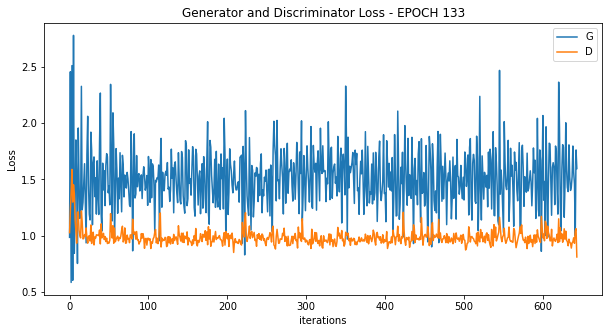

 50%|████████████████████████████████████████                                        | 322/644 [05:23<06:04,  1.13s/it]

[135/300][322/644] Loss_D: 1.0435 Loss_G: 1.0751 D(x): 0.6821 D(G(z)): 0.0759 / 0.2599


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:45<00:00,  1.00s/it]

[135/300][644/644] Loss_D: 0.9546 Loss_G: 0.6006 D(x): 0.6936 D(G(z)): 0.0794 / 0.6505


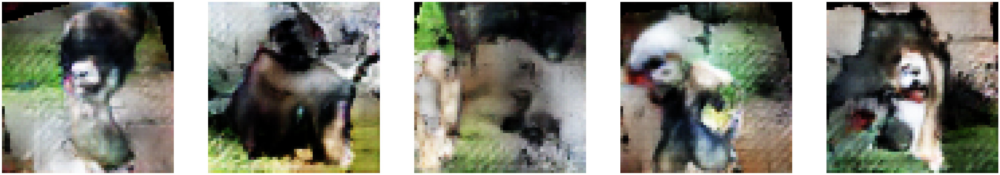

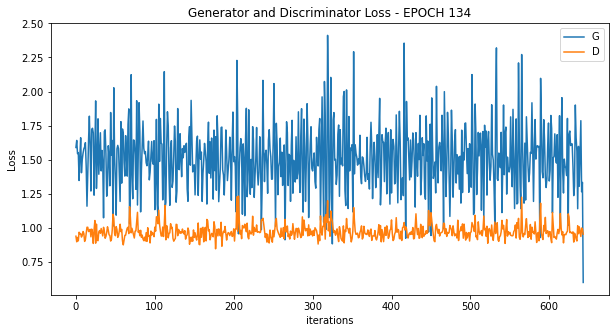

 50%|████████████████████████████████████████                                        | 322/644 [05:21<05:43,  1.07s/it]

[136/300][322/644] Loss_D: 1.0521 Loss_G: 1.1673 D(x): 0.6455 D(G(z)): 0.1294 / 0.2396


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:44<00:00,  1.00s/it]

[136/300][644/644] Loss_D: 0.9635 Loss_G: 2.8889 D(x): 0.7387 D(G(z)): 0.2127 / 0.0456


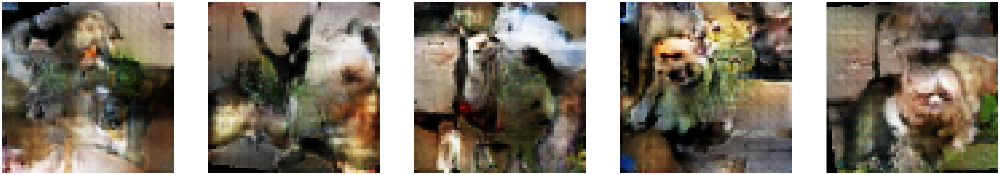

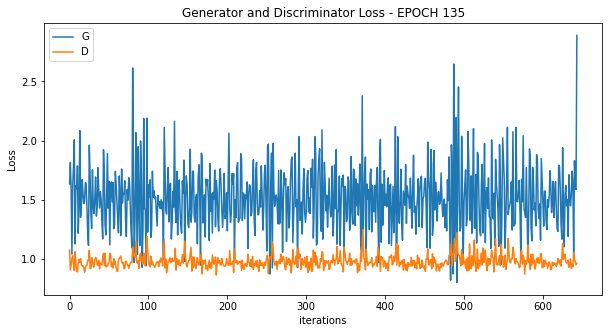

 50%|████████████████████████████████████████                                        | 322/644 [05:27<04:55,  1.09it/s]

[137/300][322/644] Loss_D: 0.9170 Loss_G: 1.7039 D(x): 0.8054 D(G(z)): 0.1415 / 0.1199


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:45<00:00,  1.00s/it]

[137/300][644/644] Loss_D: 0.9640 Loss_G: 1.1487 D(x): 0.6494 D(G(z)): 0.0965 / 0.4039


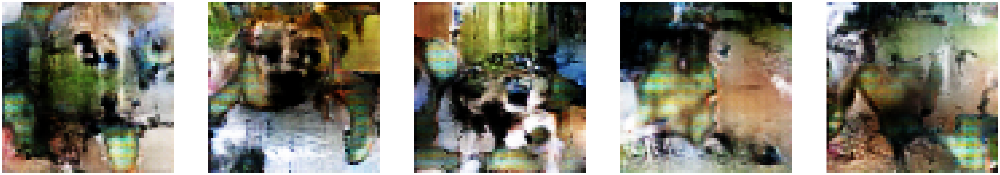

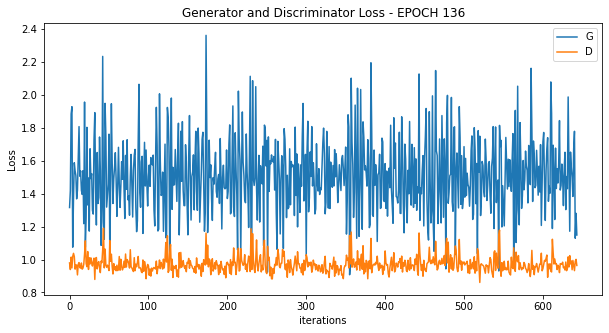

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:11,  1.03it/s]

[138/300][322/644] Loss_D: 0.9982 Loss_G: 1.3122 D(x): 0.6100 D(G(z)): 0.0883 / 0.1887


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:48<00:00,  1.01s/it]

[138/300][644/644] Loss_D: 1.0773 Loss_G: 1.2955 D(x): 0.5021 D(G(z)): 0.0949 / 0.3585


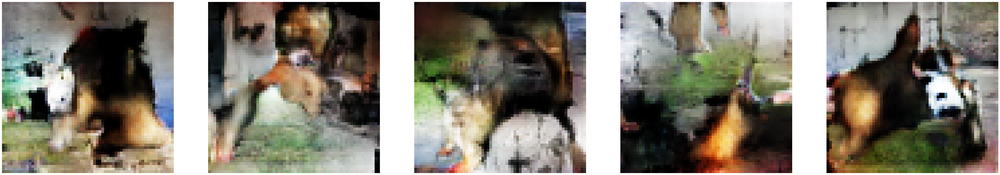

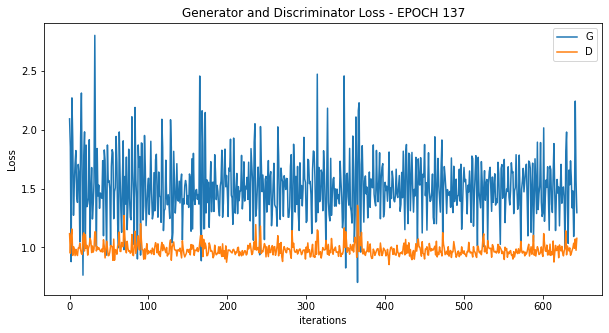

 50%|████████████████████████████████████████                                        | 322/644 [05:35<04:58,  1.08it/s]

[139/300][322/644] Loss_D: 0.9668 Loss_G: 1.5520 D(x): 0.8246 D(G(z)): 0.2199 / 0.1333


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[139/300][644/644] Loss_D: 1.3501 Loss_G: 0.9277 D(x): 0.3257 D(G(z)): 0.1275 / 0.4458


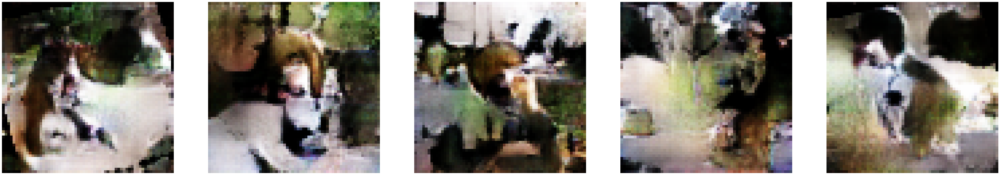

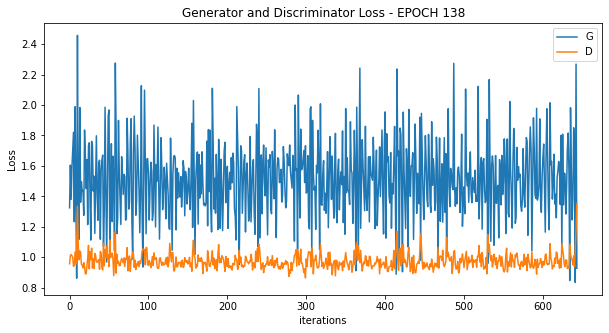

 50%|████████████████████████████████████████                                        | 322/644 [05:29<04:57,  1.08it/s]

[140/300][322/644] Loss_D: 0.9829 Loss_G: 1.3716 D(x): 0.6351 D(G(z)): 0.1334 / 0.1871


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.04s/it]

[140/300][644/644] Loss_D: 1.3532 Loss_G: 0.8766 D(x): 0.3125 D(G(z)): 0.0942 / 0.5436


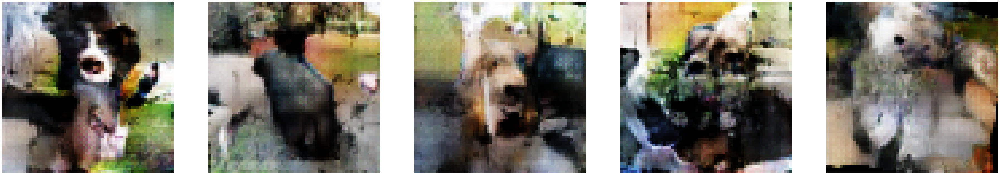

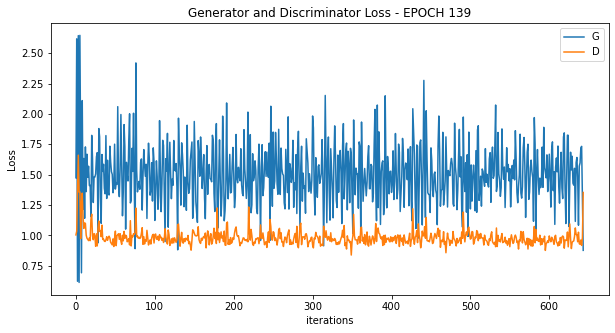

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:13,  1.03it/s]

[141/300][322/644] Loss_D: 0.8956 Loss_G: 1.7095 D(x): 0.8321 D(G(z)): 0.2436 / 0.1127


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:00<00:00,  1.03s/it]

[141/300][644/644] Loss_D: 1.0184 Loss_G: 1.0584 D(x): 0.5345 D(G(z)): 0.1622 / 0.3331


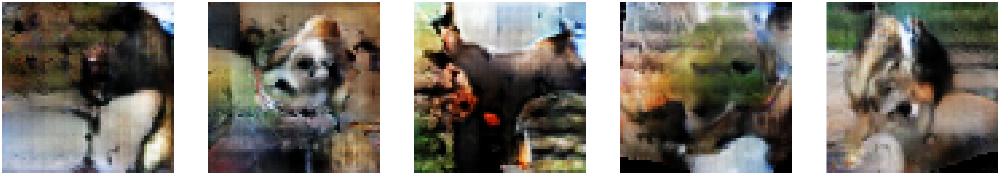

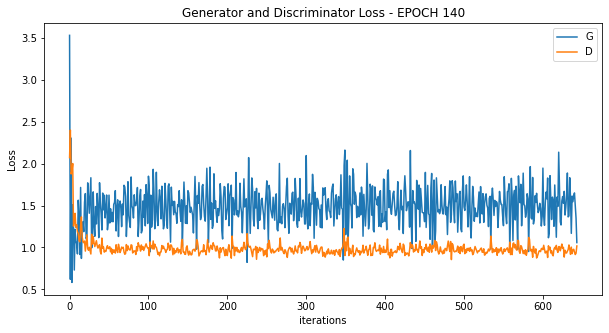

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:02,  1.07it/s]

[142/300][322/644] Loss_D: 0.9928 Loss_G: 1.5132 D(x): 0.8634 D(G(z)): 0.1400 / 0.1482


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:55<00:00,  1.02s/it]

[142/300][644/644] Loss_D: 1.0365 Loss_G: 0.6242 D(x): 0.6958 D(G(z)): 0.0831 / 0.7153


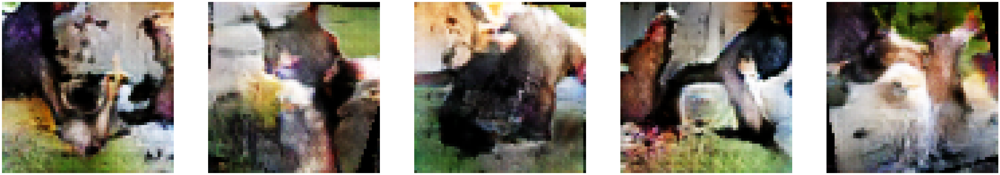

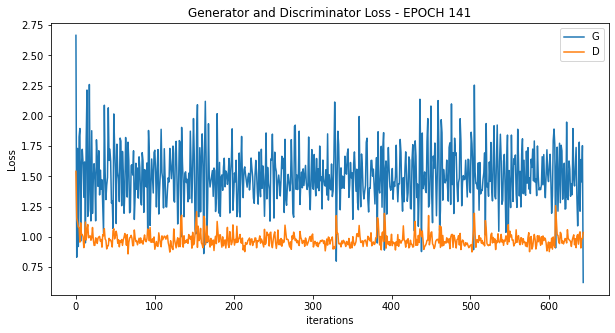

 50%|████████████████████████████████████████                                        | 322/644 [05:29<04:59,  1.08it/s]

[143/300][322/644] Loss_D: 0.9270 Loss_G: 1.8388 D(x): 0.8676 D(G(z)): 0.2352 / 0.0935


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:02<00:00,  1.03s/it]

[143/300][644/644] Loss_D: 1.0726 Loss_G: 0.5208 D(x): 0.7019 D(G(z)): 0.0678 / 0.7088


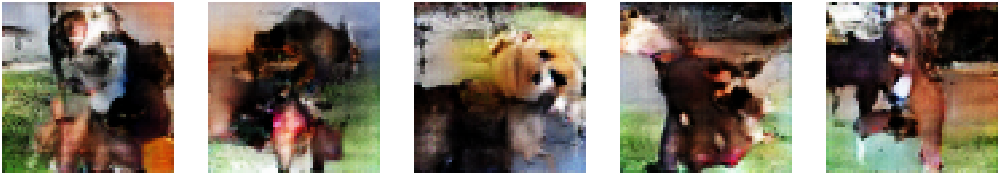

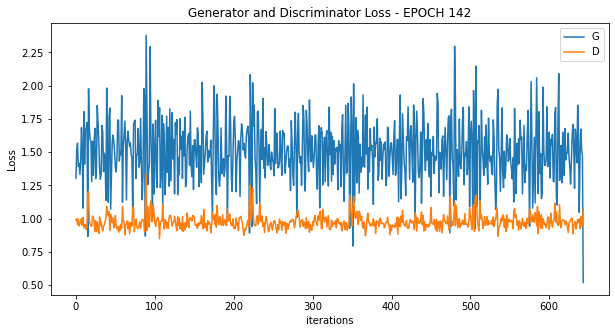

 50%|████████████████████████████████████████                                        | 322/644 [05:33<06:05,  1.14s/it]

[144/300][322/644] Loss_D: 1.0173 Loss_G: 1.6734 D(x): 0.9112 D(G(z)): 0.1724 / 0.1217


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.03s/it]

[144/300][644/644] Loss_D: 1.5818 Loss_G: 0.8015 D(x): 0.3307 D(G(z)): 0.0941 / 0.9409


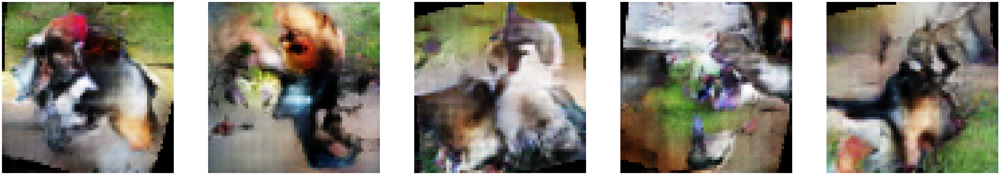

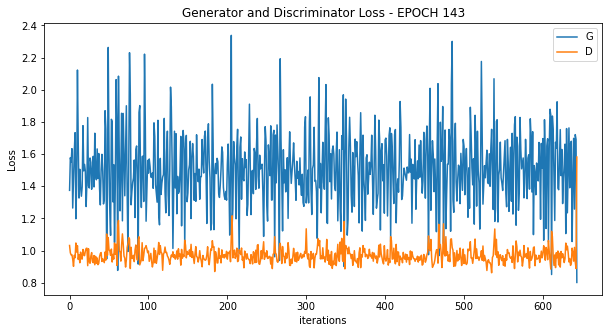

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:49,  1.09s/it]

[145/300][322/644] Loss_D: 0.9906 Loss_G: 1.4185 D(x): 0.7474 D(G(z)): 0.0914 / 0.1771


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:59<00:00,  1.02s/it]

[145/300][644/644] Loss_D: 0.9452 Loss_G: 0.8160 D(x): 0.7518 D(G(z)): 0.0776 / 0.6123


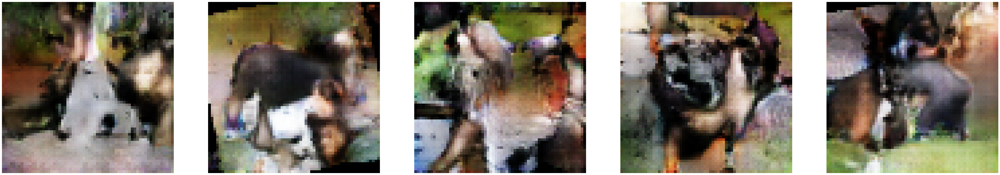

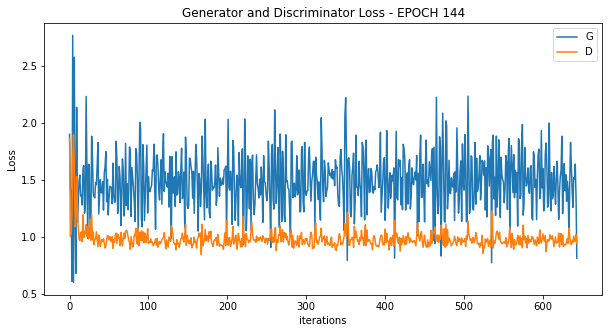

 50%|████████████████████████████████████████                                        | 322/644 [05:36<05:02,  1.06it/s]

[146/300][322/644] Loss_D: 0.9541 Loss_G: 1.5366 D(x): 0.6883 D(G(z)): 0.0939 / 0.1448


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[146/300][644/644] Loss_D: 1.0090 Loss_G: 1.8386 D(x): 0.7184 D(G(z)): 0.1399 / 0.2095


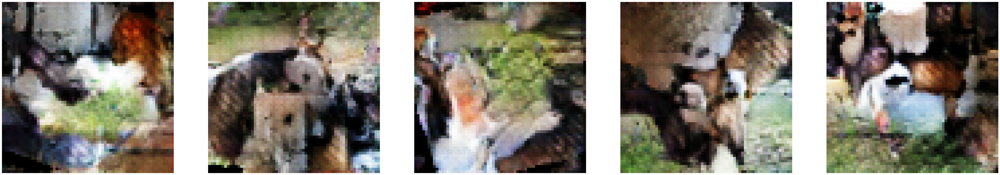

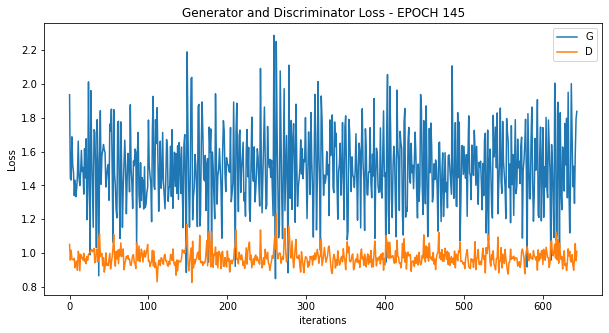

 50%|████████████████████████████████████████                                        | 322/644 [05:30<05:00,  1.07it/s]

[147/300][322/644] Loss_D: 0.9413 Loss_G: 1.7732 D(x): 0.8012 D(G(z)): 0.1666 / 0.1010


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:55<00:00,  1.02s/it]

[147/300][644/644] Loss_D: 0.9687 Loss_G: 2.2810 D(x): 0.6135 D(G(z)): 0.1150 / 0.1127


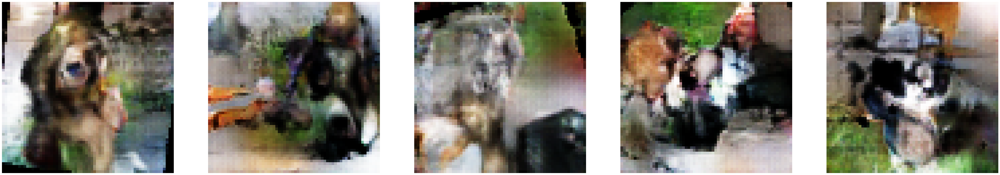

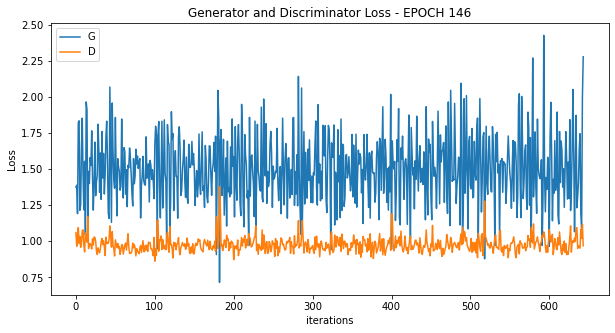

 50%|████████████████████████████████████████                                        | 322/644 [05:25<05:10,  1.04it/s]

[148/300][322/644] Loss_D: 0.9343 Loss_G: 1.3897 D(x): 0.7668 D(G(z)): 0.1680 / 0.1683


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[148/300][644/644] Loss_D: 0.9600 Loss_G: 0.9161 D(x): 0.6402 D(G(z)): 0.1406 / 0.3982


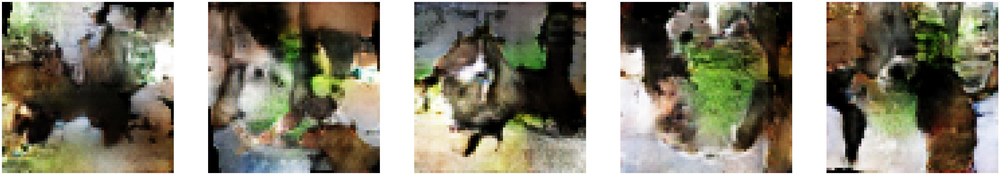

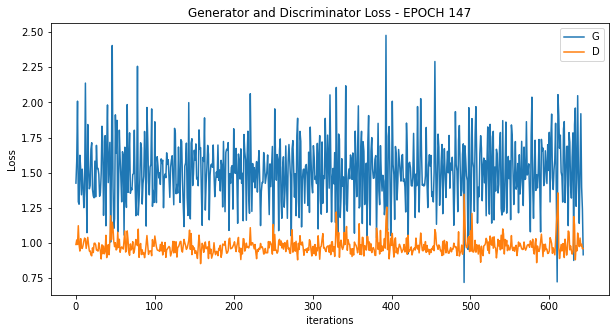

 50%|████████████████████████████████████████                                        | 322/644 [05:21<05:01,  1.07it/s]

[149/300][322/644] Loss_D: 0.9495 Loss_G: 1.5357 D(x): 0.8087 D(G(z)): 0.1611 / 0.1351


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[149/300][644/644] Loss_D: 1.2861 Loss_G: 0.9624 D(x): 0.8298 D(G(z)): 0.0410 / 0.9516


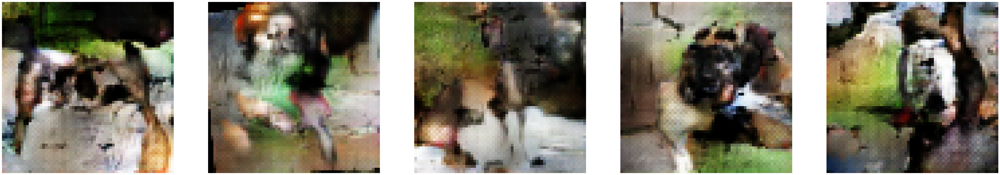

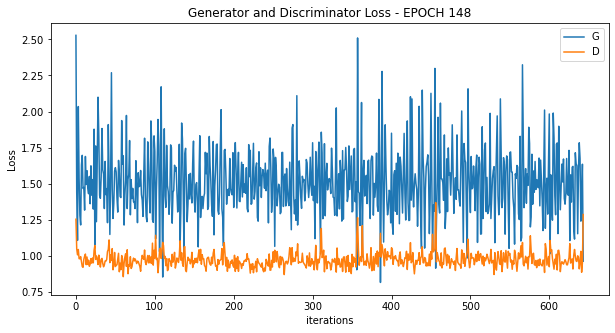

 50%|████████████████████████████████████████                                        | 322/644 [05:19<06:04,  1.13s/it]

[150/300][322/644] Loss_D: 0.9229 Loss_G: 1.4967 D(x): 0.7290 D(G(z)): 0.1413 / 0.1476


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:01<00:00,  1.03s/it]

[150/300][644/644] Loss_D: 0.9393 Loss_G: 0.8009 D(x): 0.6195 D(G(z)): 0.0777 / 0.5076


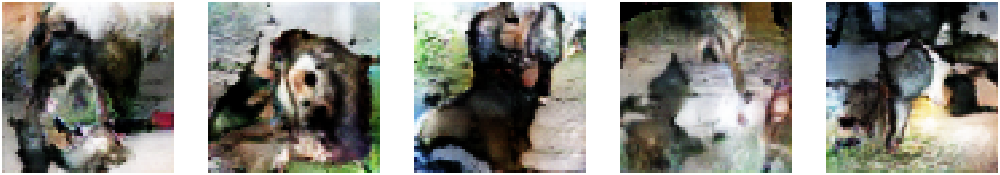

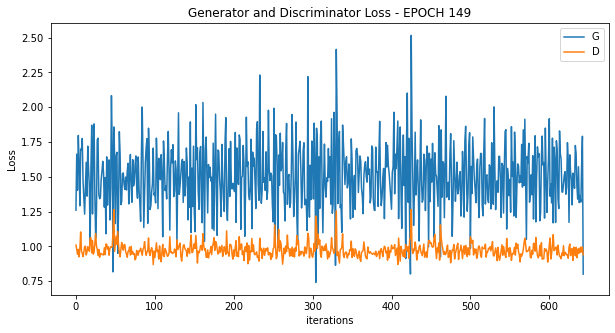

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:59,  1.12s/it]

[151/300][322/644] Loss_D: 0.9129 Loss_G: 1.5875 D(x): 0.8002 D(G(z)): 0.1720 / 0.1286


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[151/300][644/644] Loss_D: 1.1382 Loss_G: 2.1910 D(x): 0.8815 D(G(z)): 0.1813 / 0.2196


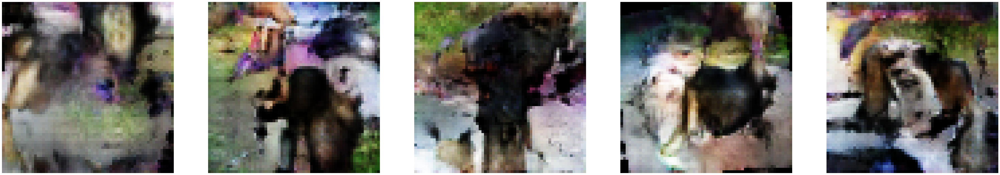

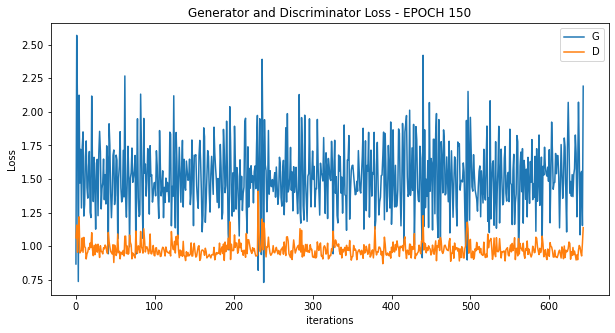

 50%|████████████████████████████████████████                                        | 322/644 [05:34<05:01,  1.07it/s]

[152/300][322/644] Loss_D: 1.1714 Loss_G: 0.9423 D(x): 0.5346 D(G(z)): 0.1034 / 0.3265


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:07<00:00,  1.04s/it]

[152/300][644/644] Loss_D: 1.2772 Loss_G: 0.7201 D(x): 0.4373 D(G(z)): 0.0221 / 0.7649


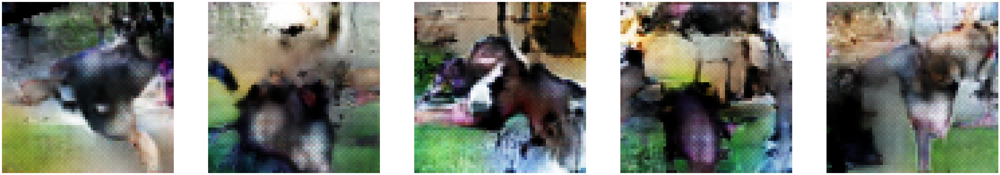

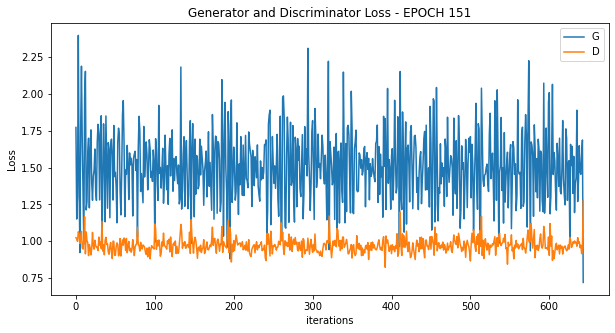

 50%|████████████████████████████████████████                                        | 322/644 [05:21<05:05,  1.06it/s]

[153/300][322/644] Loss_D: 0.9284 Loss_G: 1.5952 D(x): 0.8027 D(G(z)): 0.1891 / 0.1328


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:59<00:00,  1.02s/it]

[153/300][644/644] Loss_D: 0.8935 Loss_G: 3.4204 D(x): 0.7668 D(G(z)): 0.2594 / 0.0148


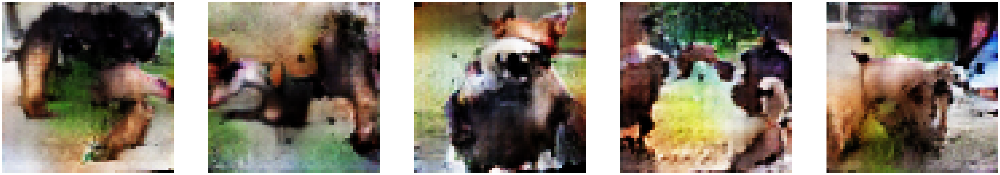

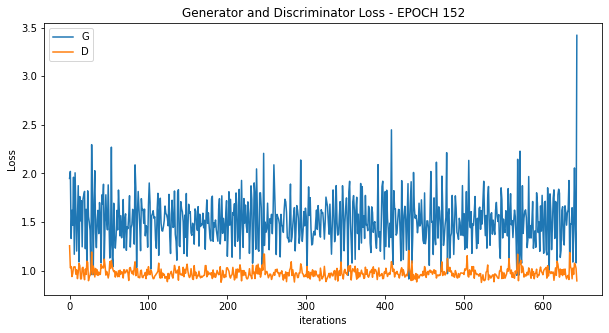

 50%|████████████████████████████████████████                                        | 322/644 [05:23<06:46,  1.26s/it]

[154/300][322/644] Loss_D: 1.0152 Loss_G: 2.0588 D(x): 0.8969 D(G(z)): 0.2870 / 0.0738


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:57<00:00,  1.02s/it]

[154/300][644/644] Loss_D: 1.3548 Loss_G: 0.8426 D(x): 0.4286 D(G(z)): 0.0878 / 0.8951


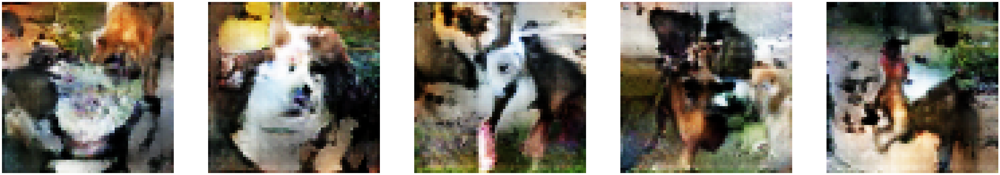

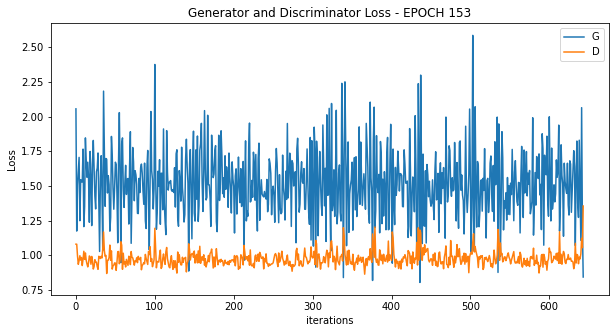

 50%|████████████████████████████████████████                                        | 322/644 [05:26<06:29,  1.21s/it]

[155/300][322/644] Loss_D: 0.9687 Loss_G: 1.6593 D(x): 0.8291 D(G(z)): 0.1194 / 0.1192


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.02s/it]

[155/300][644/644] Loss_D: 1.6074 Loss_G: 0.6103 D(x): 0.2491 D(G(z)): 0.1012 / 0.6971


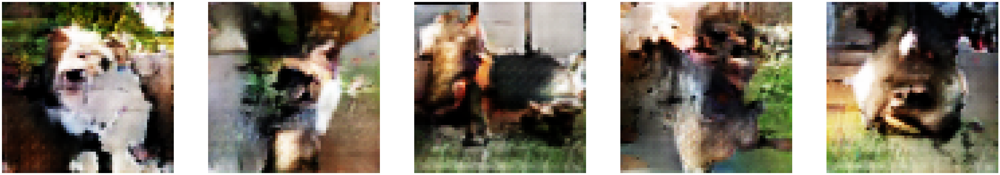

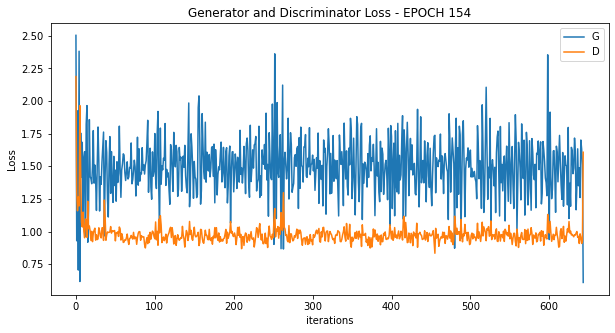

 50%|████████████████████████████████████████                                        | 322/644 [05:27<06:12,  1.16s/it]

[156/300][322/644] Loss_D: 1.0187 Loss_G: 1.2758 D(x): 0.6387 D(G(z)): 0.1300 / 0.2083


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:54<00:00,  1.02s/it]

[156/300][644/644] Loss_D: 1.2294 Loss_G: 0.6957 D(x): 0.7591 D(G(z)): 0.0337 / 0.8984


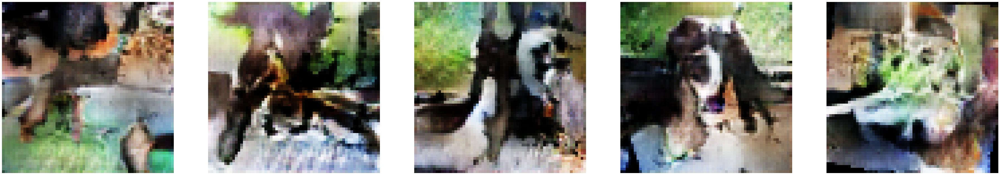

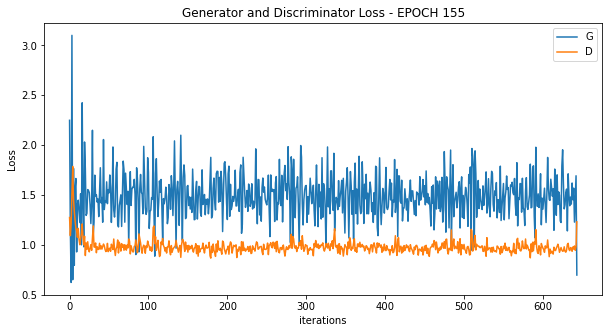

 50%|████████████████████████████████████████                                        | 322/644 [05:35<06:39,  1.24s/it]

[157/300][322/644] Loss_D: 0.9645 Loss_G: 1.5471 D(x): 0.8069 D(G(z)): 0.2422 / 0.1345


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:54<00:00,  1.02s/it]

[157/300][644/644] Loss_D: 0.8311 Loss_G: 1.3436 D(x): 0.8295 D(G(z)): 0.1134 / 0.2599


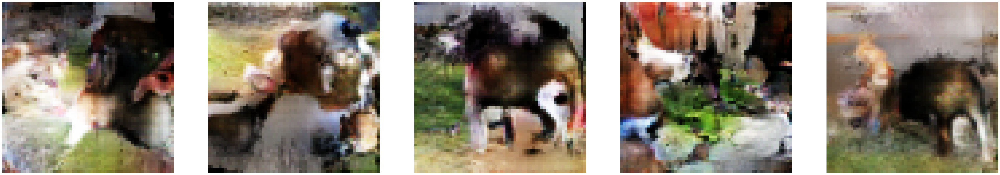

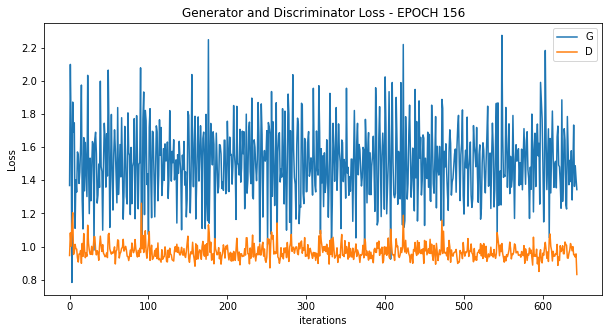

 50%|████████████████████████████████████████                                        | 322/644 [05:32<04:59,  1.07it/s]

[158/300][322/644] Loss_D: 1.0698 Loss_G: 1.2442 D(x): 0.5562 D(G(z)): 0.1503 / 0.2036


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:53<00:00,  1.01s/it]

[158/300][644/644] Loss_D: 1.9421 Loss_G: 0.6813 D(x): 0.1925 D(G(z)): 0.0931 / 0.9417


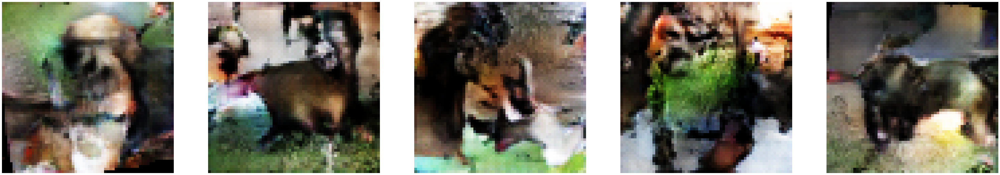

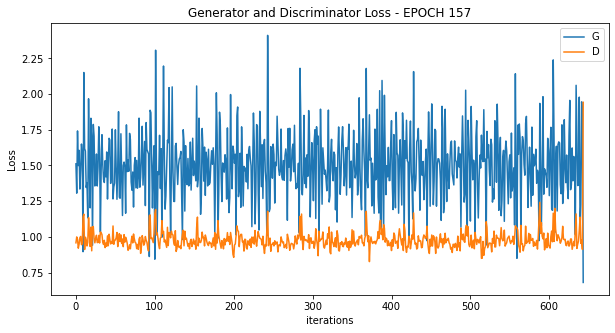

 50%|████████████████████████████████████████                                        | 322/644 [05:35<05:05,  1.06it/s]

[159/300][322/644] Loss_D: 1.0079 Loss_G: 1.3444 D(x): 0.6300 D(G(z)): 0.1076 / 0.1841


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:06<00:00,  1.04s/it]

[159/300][644/644] Loss_D: 0.9271 Loss_G: 2.0305 D(x): 0.6519 D(G(z)): 0.1111 / 0.2854


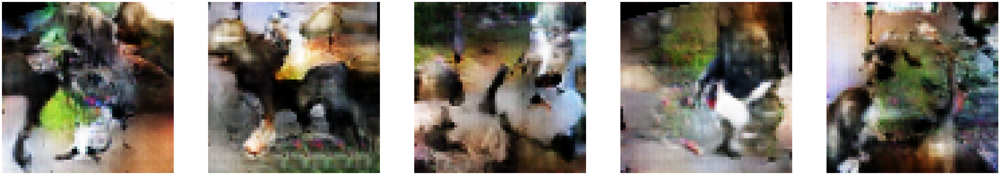

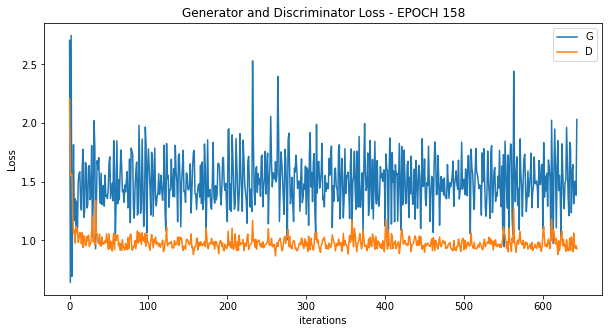

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:06,  1.05it/s]

[160/300][322/644] Loss_D: 1.0995 Loss_G: 1.8560 D(x): 0.9025 D(G(z)): 0.3453 / 0.0995


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:58<00:00,  1.02s/it]

[160/300][644/644] Loss_D: 1.0824 Loss_G: 3.1460 D(x): 0.6108 D(G(z)): 0.2653 / 0.0408


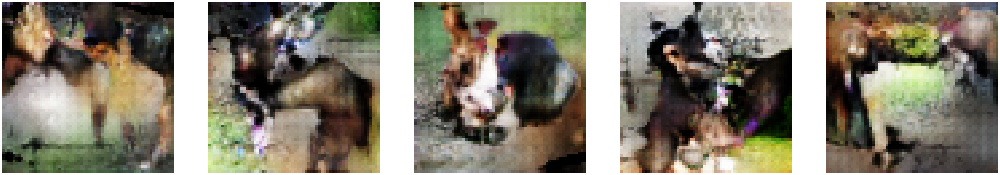

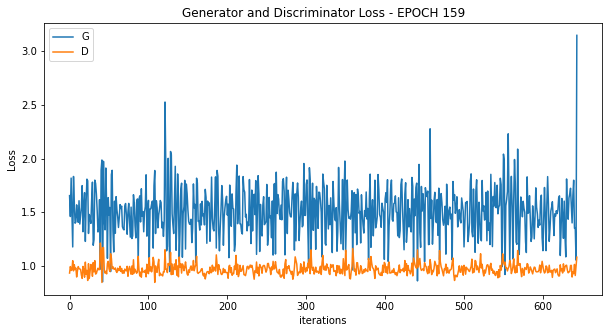

 50%|████████████████████████████████████████                                        | 322/644 [05:19<05:02,  1.07it/s]

[161/300][322/644] Loss_D: 0.9818 Loss_G: 1.2470 D(x): 0.6555 D(G(z)): 0.1192 / 0.2117


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:50<00:00,  1.01s/it]

[161/300][644/644] Loss_D: 1.1334 Loss_G: 0.8455 D(x): 0.6659 D(G(z)): 0.0840 / 0.9227


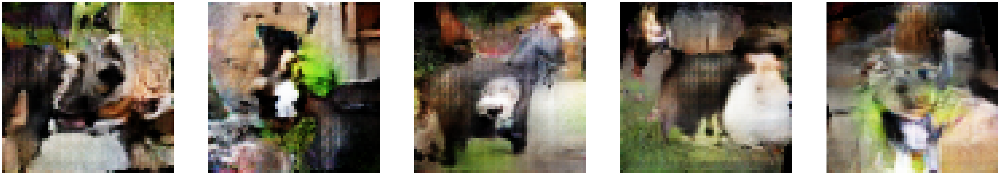

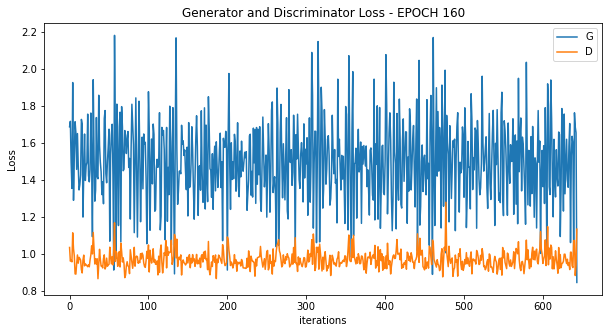

 50%|████████████████████████████████████████                                        | 322/644 [05:25<05:44,  1.07s/it]

[162/300][322/644] Loss_D: 0.9473 Loss_G: 1.4685 D(x): 0.8028 D(G(z)): 0.1352 / 0.1490


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:49<00:00,  1.01s/it]

[162/300][644/644] Loss_D: 1.3945 Loss_G: 0.5838 D(x): 0.3357 D(G(z)): 0.0440 / 0.7755


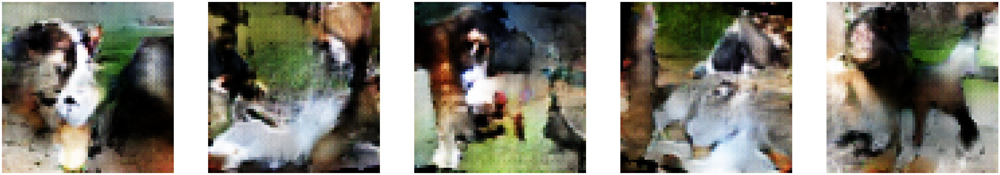

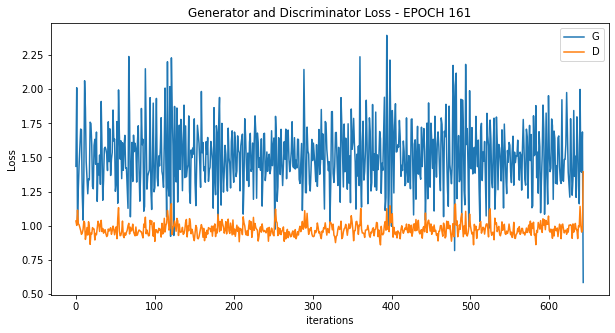

 50%|████████████████████████████████████████                                        | 322/644 [05:39<04:59,  1.08it/s]

[163/300][322/644] Loss_D: 1.0244 Loss_G: 1.7637 D(x): 0.8385 D(G(z)): 0.2860 / 0.1047


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:00<00:00,  1.03s/it]

[163/300][644/644] Loss_D: 1.2474 Loss_G: 1.3913 D(x): 0.3538 D(G(z)): 0.1882 / 0.1555


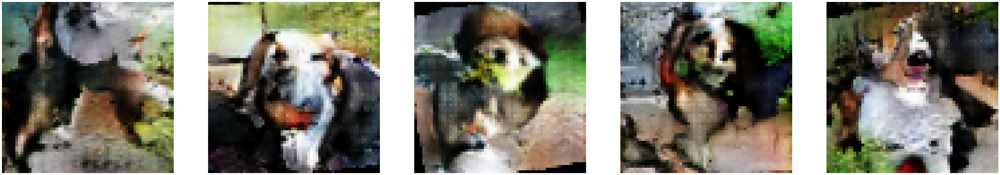

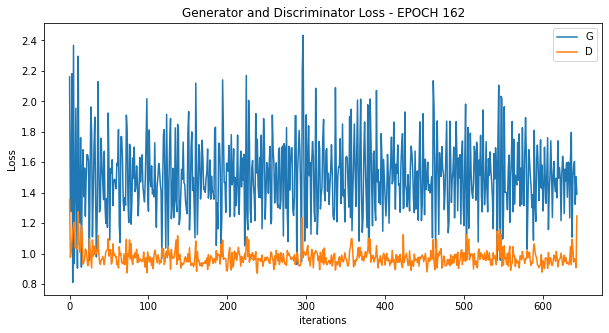

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:01,  1.07it/s]

[164/300][322/644] Loss_D: 1.0137 Loss_G: 1.2004 D(x): 0.6483 D(G(z)): 0.1568 / 0.2393


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:02<00:00,  1.03s/it]

[164/300][644/644] Loss_D: 0.9835 Loss_G: 0.6335 D(x): 0.6002 D(G(z)): 0.0614 / 0.7609


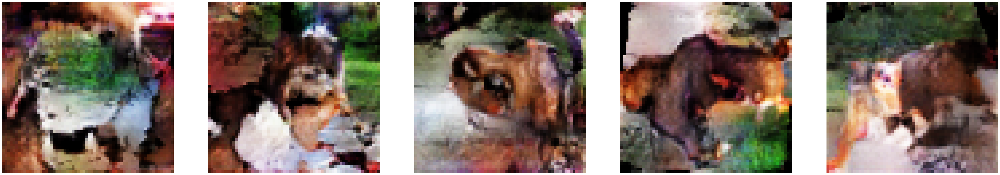

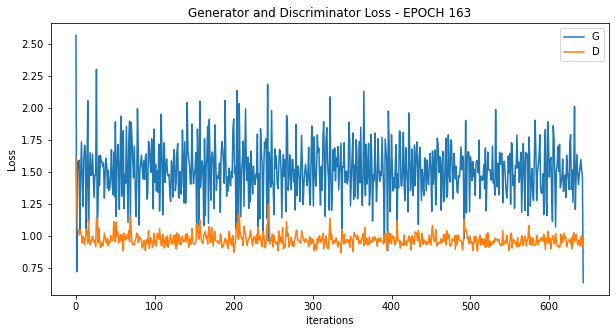

 50%|████████████████████████████████████████                                        | 322/644 [05:24<05:46,  1.07s/it]

[165/300][322/644] Loss_D: 0.8479 Loss_G: 1.8132 D(x): 0.8144 D(G(z)): 0.1076 / 0.0973


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [10:49<00:00,  1.01s/it]

[165/300][644/644] Loss_D: 1.3889 Loss_G: 0.6862 D(x): 0.4605 D(G(z)): 0.0694 / 0.9615


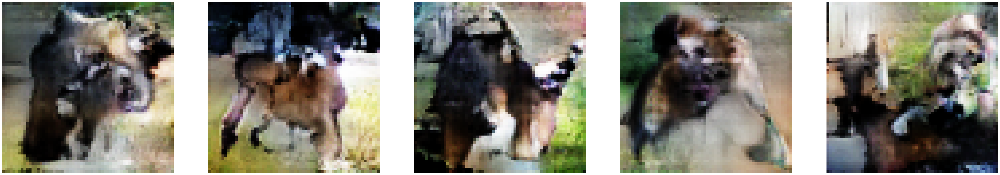

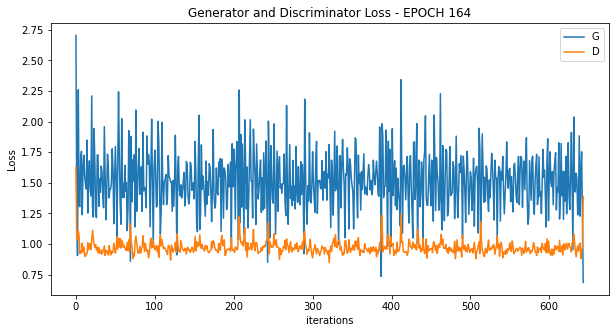

 50%|████████████████████████████████████████                                        | 322/644 [05:32<05:48,  1.08s/it]

[166/300][322/644] Loss_D: 0.9174 Loss_G: 1.6483 D(x): 0.7612 D(G(z)): 0.1931 / 0.1208


100%|████████████████████████████████████████████████████████████████████████████████| 644/644 [11:01<00:00,  1.03s/it]

[166/300][644/644] Loss_D: 1.4940 Loss_G: 1.4835 D(x): 0.2764 D(G(z)): 0.1655 / 0.2971


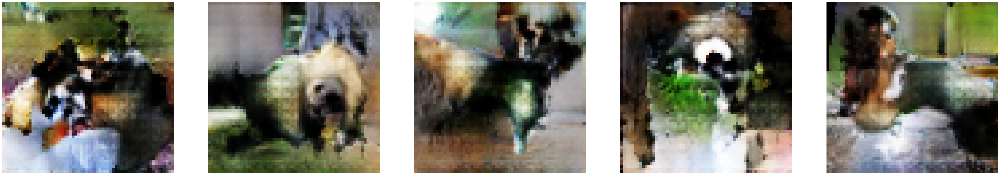

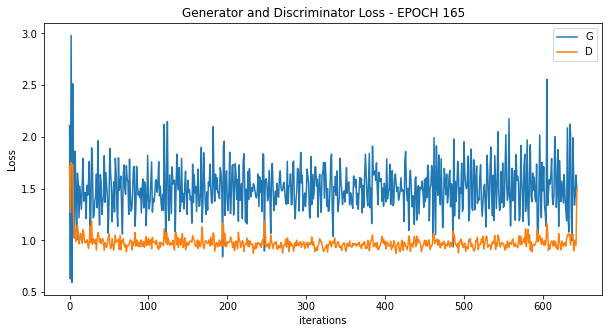

  0%|▍                                                                                 | 3/644 [00:04<16:30,  1.54s/it]


KeyboardInterrupt: 

In [14]:
train(use_chkpt=True)

In [15]:
if not os.path.exists('../output-images-dcgan-v6/'):
    os.mkdir('../output-images-dcgan-v6/')
    
im_batch_size = 50
n_images=500

for i_batch in tqdm(range(0, n_images, im_batch_size)):
    gen_z = torch.randn(im_batch_size, nz, 1, 1, device=device)
    gen_images = netG(gen_z)
    images = gen_images.to("cpu").clone().detach()
    images = images.numpy().transpose(0, 2, 3, 1)
    images
    for i_image in range(gen_images.size(0)):
        save_image((gen_images[i_image, :, :, :]+1.)/2., os.path.join('../output-images-dcgan-v6/', f'image_{i_batch+i_image:05d}.png'))

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:04<00:00,  2.48it/s]
